In [1]:
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
import numpy as np
import math
from matplotlib import cm
import seaborn as seaborn
from numpy import unravel_index
from scipy.ndimage.filters import minimum_filter,maximum_filter
from scipy.fft import fft, fftfreq, irfft, rfft, rfftfreq
import numpy.fft
from scipy.integrate import odeint
import pandas as pd


erf = np.vectorize(math.erf)

/var/folders/8b/q7wvzpts7t32vkh6tl04z77r0000gp/T/ipykernel_31432/1398544628.py:8: DeprecationWarning: Please use `minimum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import minimum_filter,maximum_filter
/var/folders/8b/q7wvzpts7t32vkh6tl04z77r0000gp/T/ipykernel_31432/1398544628.py:8: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import minimum_filter,maximum_filter


In [2]:
def Nbrugger(nref, f):    
    #n=3.6594+0.084438*1j  # refractive index of GaAs as 780 nm
    return 0.5*np.sqrt(3*f*(1-nref**2)+(2*nref**2-1)+np.sqrt((3*f*(1-nref**2)+(2*nref**2-1))**2+8*nref**2))

def reflection(pol, n1, n2,n3,theta):   
    a1 = n2*np.cos(np.arcsin((n1/n2)*np.sin(theta)))
    a2 = n3*np.cos(np.arcsin((n1/n3)*np.sin(theta)))
    b1 = n3*np.cos(np.arcsin((n1/n2)*np.sin(theta)))
    b2 = n2*np.cos(np.arcsin((n1/n3)*np.sin(theta)))
    if pol=="s":
        r = (a1-a2) / (a1+a2)
    elif pol=="p":
        r = (b1-b2) / (b1+b2)
    else: 
        print ("error")
    return r

def transmission(pol, n1, n2,n3,theta):
    a1 = n2*np.cos(np.arcsin((n1/n2)*np.sin(theta)))
    a2 = n3*np.cos(np.arcsin((n1/n3)*np.sin(theta)))
    b1 = n3*np.cos(np.arcsin((n1/n2)*np.sin(theta)))
    b2 = n2*np.cos(np.arcsin((n1/n3)*np.sin(theta)))
    if pol=="s":
        t = (2*a1) / (a1+a2)
    elif pol=="p":
        t = (2*a1) / (b2+b1)
    else: 
        print ("error")
    return (t)

def beta(wavelength,n1,n3,h,theta):
    return ((2*np.pi)/wavelength)*n3*h*np.cos(np.arcsin((n1/n3)*np.sin(theta)))

def Transmission(pol,n1,n2,n3,theta):
    transarray = np.array([[(1),(reflection(pol, n1, n2,n3,theta))],
                     [(reflection(pol, n1, n2,n3,theta)),(1)]])
    Dmm = 1/(transmission(pol, n1, n2,n3,theta))
    return Dmm*transarray

def Propagation(wavelength,n1,n3,h,theta):
    return np.array([[(np.exp(-1j*beta(wavelength,n1,n3,h,theta))),0]
                     ,[0,(np.exp(1j*beta(wavelength,n1,n3,h,theta)))]])

def M(pol,n1,n2,n3,wavelength,h1,theta):
    return Transmission(pol,n1,n1,n2,theta).dot(Propagation(wavelength,n1,n2,h1,theta)).dot(Transmission(pol,n1,n2,n3,theta))


def Reflectivity(pol,n1,nref,n3,wavelength,h1,theta,f):
    n2=Nbrugger(nref,f)
    return abs(M(pol,n1,n2,n3,wavelength,h1,theta).item(1,0)/M(pol,n1,n2,n3,wavelength,h1,theta).item(0,0))**2


#def RGaAsTF(pol,n1,nref,n3,wavelength,h1,theta,f):
#    n2=Nbrugger(nref,f)
#    return abs(M(pol,n1,n2,n3,wavelength,h1,theta).item(1,0)/M(pol,n1,n2,n3,wavelength,h1,theta).item(0,0))**2

In [3]:
ngaas=3.6594+0.084438*1j  # refractive index of GaAs at 780 nm
ninas=3.7510+0.45994*1j  # refractive index of InAs at 780 nm

In [4]:
wavelength=780e-9
testf=np.linspace(0,1,1001)
testH=np.linspace(0,1000e-9,1001)
nair=1

hgaas=np.linspace(0,1000e-9,1001)
fgaas=np.linspace(0,1.0,1001)
thickness_gaas,volume_fraction_gaas=np.meshgrid(hgaas,fgaas)
Rgaas=np.zeros([len(thickness_gaas),len(volume_fraction_gaas)])
for i in range(len(thickness_gaas)):
    for j in range(len(volume_fraction_gaas)):
        Rgaas[i,j]=Reflectivity("s",nair,ngaas,ngaas,wavelength,hgaas[i],0,fgaas[j])

Text(0.5, 0, 'Thickness (nm)')

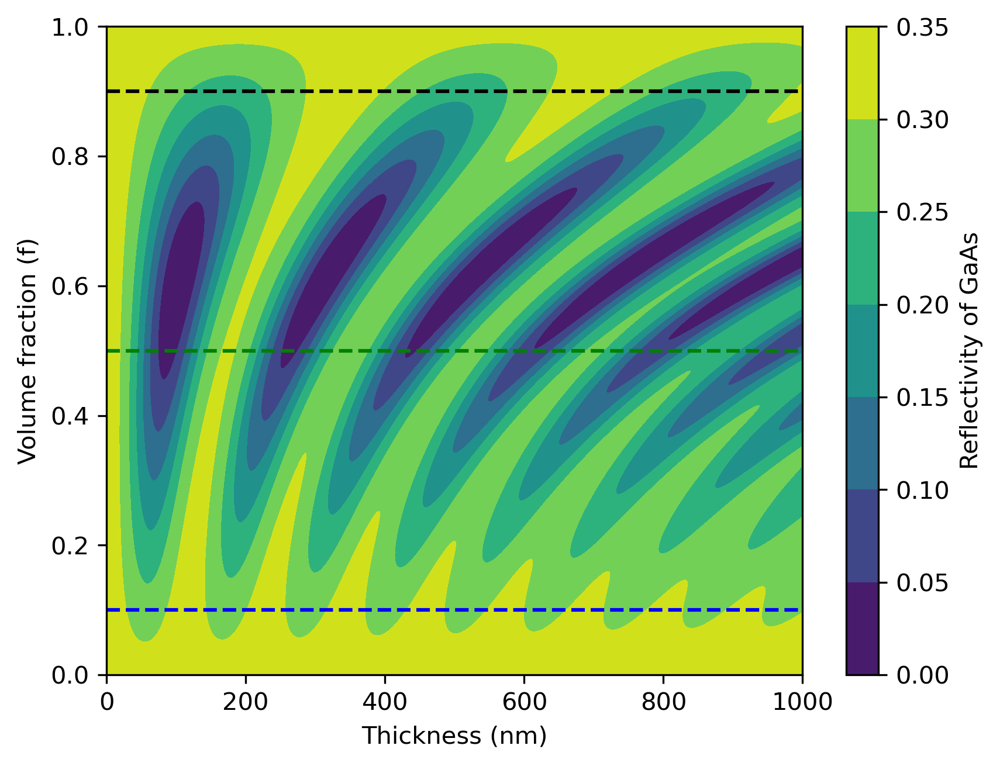

In [5]:
vf=np.linspace(0,1000,1001)
hh=np.linspace(0,1.0,1001)
hplot,vfplot=np.meshgrid(hh,vf)


plt.figure(dpi=300)
plt.contourf(vfplot,hplot,Rgaas)
plt.colorbar(label='Reflectivity of GaAs')
plt.axhline(y=0.1, color='blue', ls='--')
plt.axhline(y=0.5, color='green', ls='--')
plt.axhline(y=0.9, color='black', ls='--')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')

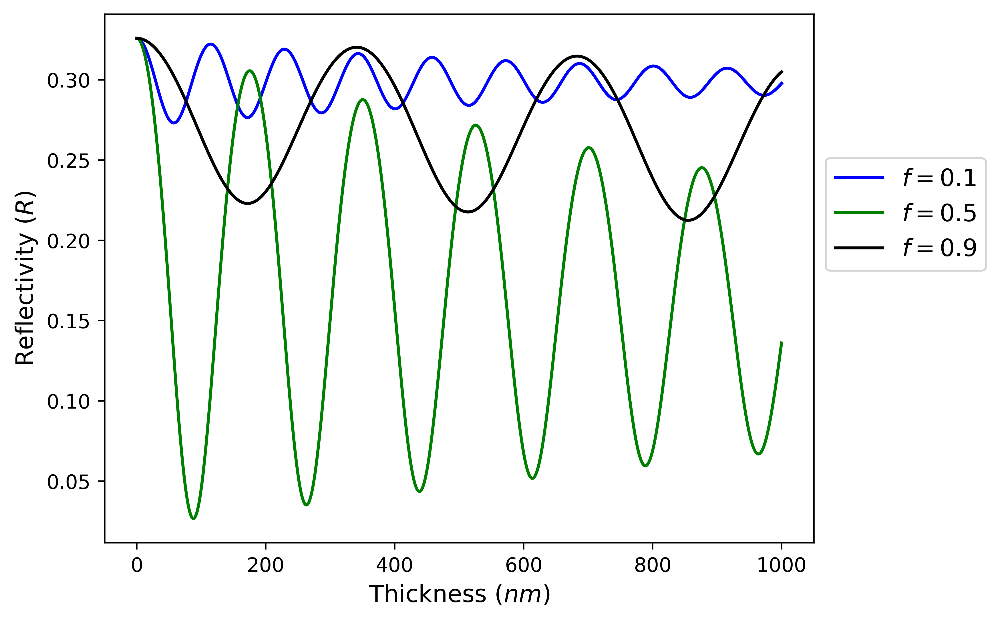

In [8]:
plt.figure(dpi=500)
plt.plot(vf,Rgaas[:,100],color='blue', label=r"$f=0.1$")
plt.plot(vf,Rgaas[:,500],color='green', label=r"$f=0.5$" )
plt.plot(vf,Rgaas[:,900],color='black', label=r"$f=0.9$")

#plt.plot(fgr,R[nindex6,:], label="f=0.605")
#plt.plot(ff,(Rf5), label="h = 990nm")

#plt.axvline(0.66, linewidth=1, color='black', linestyle='--')

plt.ylabel("Reflectivity ($R$)",fontsize=12)
plt.xlabel("Thickness ($nm$)" ,fontsize=12)
#plt.title("Using $h=\frac{\lambda}{4n_{BEMA}(0.2)}$" ,fontsize=12)
plt.legend(bbox_to_anchor=(1,0.75),prop={'size':12})

Text(0.5, 0, 'Thickness (nm)')

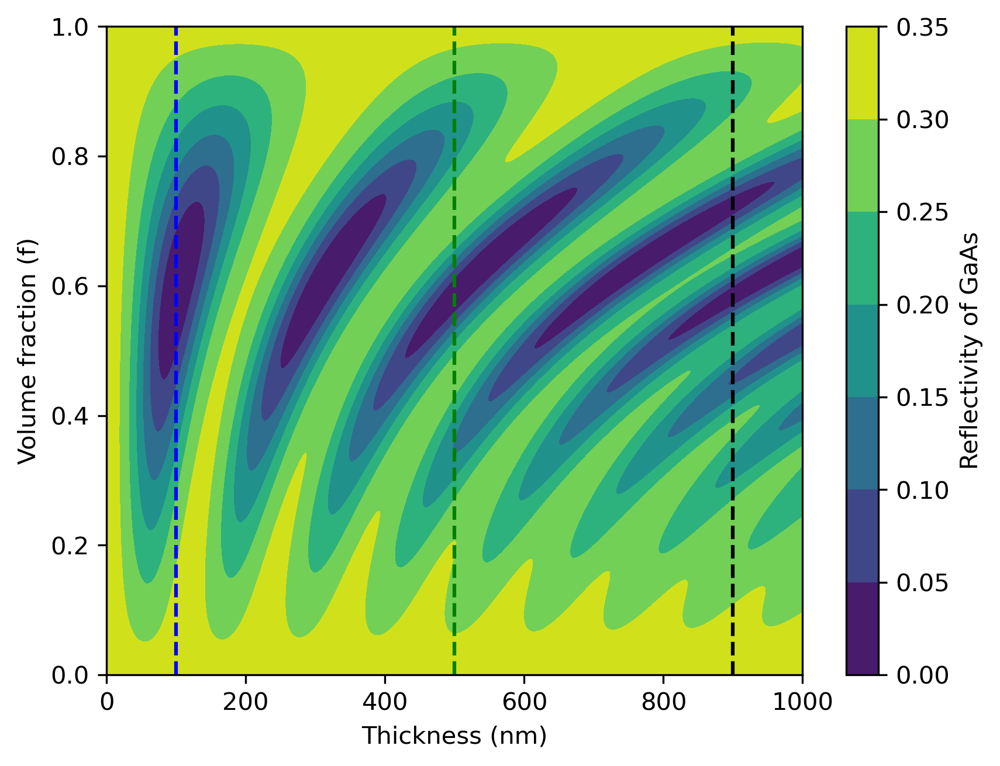

In [6]:
vf=np.linspace(0,1000,1001)
hh=np.linspace(0,1.0,1001)
hplot,vfplot=np.meshgrid(hh,vf)


plt.figure(dpi=300)
plt.contourf(vfplot,hplot,Rgaas)
plt.colorbar(label='Reflectivity of GaAs')
plt.axvline(x=100, color='blue', ls='--')
plt.axvline(x=500, color='green', ls='--')
plt.axvline(x=900, color='black', ls='--')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')

In [ ]:
plt.figure(dpi=500)
plt.plot(hh,Rgaas[100,:],color='blue', label=r"$h=100nm$")
plt.plot(hh,Rgaas[500,:],color='green', label=r"$h=500nm$" )
plt.plot(hh,Rgaas[900,:],color='black', label=r"$h=900nm$")

#plt.plot(fgr,R[nindex6,:], label="f=0.605")
#plt.plot(ff,(Rf5), label="h = 990nm")

#plt.axvline(0.66, linewidth=1, color='black', linestyle='--')

plt.ylabel("Reflectivity ($R$)",fontsize=12)
plt.xlabel("Volume Fraction ($f$)" ,fontsize=12)
#plt.title("Using $h=\frac{\lambda}{4n_{BEMA}(0.2)}$" ,fontsize=12)
plt.legend(bbox_to_anchor=(1,0.75),prop={'size':12})

In [ ]:
minima_gaas = (Rgaas == minimum_filter(Rgaas, 8, mode='constant', cval=0.0))
res_gaas = np.where(1 == minima_gaas)
print(res_gaas)
print(Rgaas[0,0])
print(Rgaas[104,600])
print(Rgaas[319,620])
print(Rgaas[544,630])
print(Rgaas[778,640])
print(Rgaas[778,800])

160


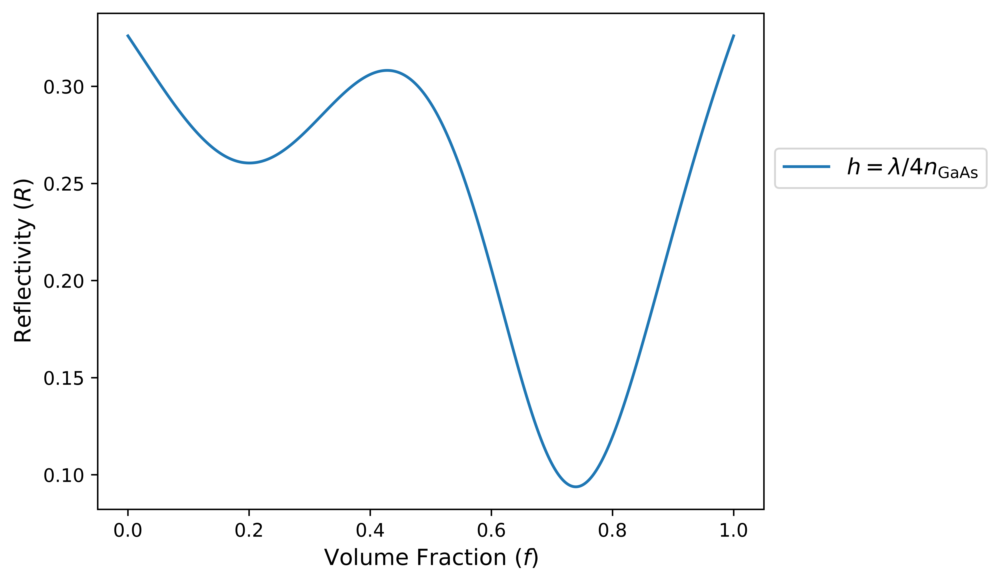

In [9]:
hgr=np.linspace(0,1000e-9,1001)
fgr=np.linspace(0,1.0,1001)

plt.figure(dpi=1000)
ng1=780*3/(4*Nbrugger(ngaas,0))
ng2=780*3/(4*Nbrugger(ngaas,0.2))
ng3=780*3/(4*Nbrugger(ngaas,0.4))
ng4=780*3/(4*Nbrugger(ngaas,0.6))
ng5=780*3/(4*Nbrugger(ngaas,0.8))
#ng66=780*3/(4*Nbrugger(0.607))
nindex1=round(abs(ng1))
nindex2=round(abs(ng2))
nindex3=round(abs(ng3))
nindex4=round(abs(ng4))
nindex5=round(abs(ng5))
#nindex6=round(abs(ng66))

#plt.yscale('log')
plt.plot(fgr,Rgaas[nindex1,:], label=r"$h={\lambda}/{4n_{\mathrm{GaAs}}}$")
#plt.plot(fgr,Rgaas[nindex2,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.2)}$" )
#plt.plot(fgr,Rgaas[nindex3,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.4)}$")
#plt.plot(fgr,Rgaas[nindex4,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.6)}$")
#plt.plot(fgr,Rgaas[nindex5,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.8)}$")
#plt.plot(fgr,R[nindex6,:], label="f=0.605")
#plt.plot(ff,(Rf5), label="h = 990nm")

#plt.axvline(0.66, linewidth=1, color='black', linestyle='--')
plt.ylabel("Reflectivity ($R$)",fontsize=12)
plt.xlabel("Volume Fraction ($f$)" ,fontsize=12)
#plt.title("Using $h=\frac{\lambda}{4n_{BEMA}(0.2)}$" ,fontsize=12)
plt.legend(bbox_to_anchor=(1,0.75),prop={'size':12})
print(nindex1)

Text(0.5, 0, 'Thickness (nm)')

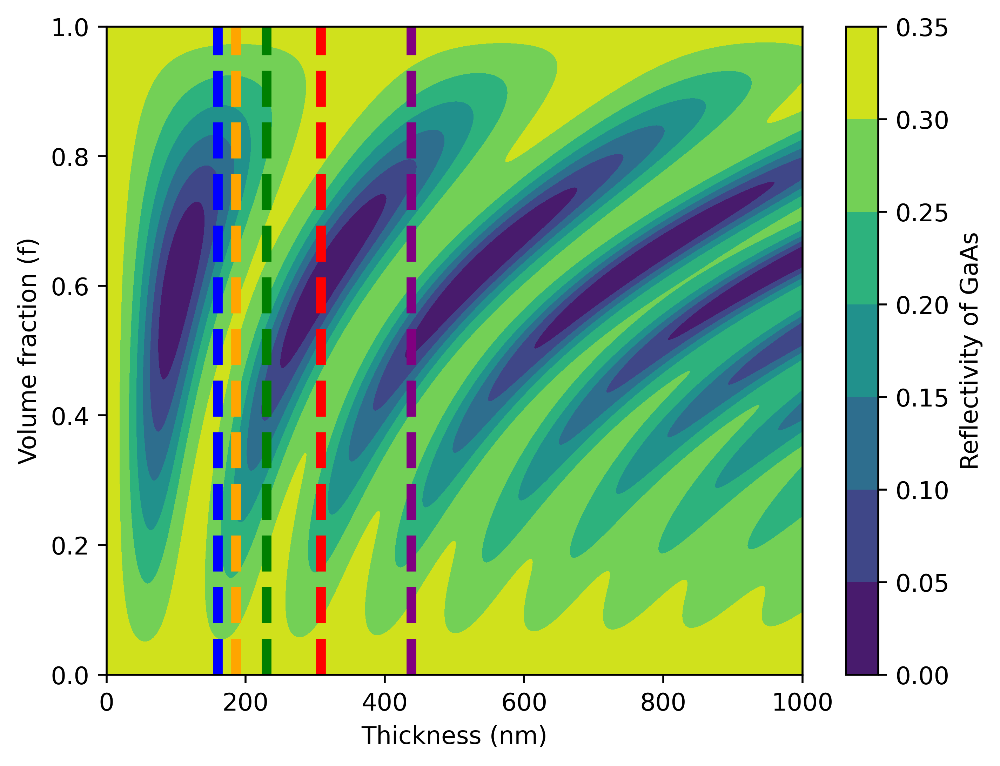

In [10]:
vf=np.linspace(0,1000,1001)
hh=np.linspace(0,1.0,1001)
hplot,vfplot=np.meshgrid(hh,vf)

plt.figure(dpi=500)
plt.contourf(vfplot,hplot,Rgaas)
plt.colorbar(label='Reflectivity of GaAs')
plt.axvline(x=nindex1, color='blue', ls='--', linewidth='4')
plt.axvline(x=nindex2, color='orange', ls='--', linewidth='4')
plt.axvline(x=nindex3, color='green', ls='--', linewidth='4')
plt.axvline(x=nindex4, color='red', ls='--', linewidth='4')
plt.axvline(x=nindex5, color='purple', ls='--', linewidth='4')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')

Text(0.5, 0, 'Thickness (nm)')

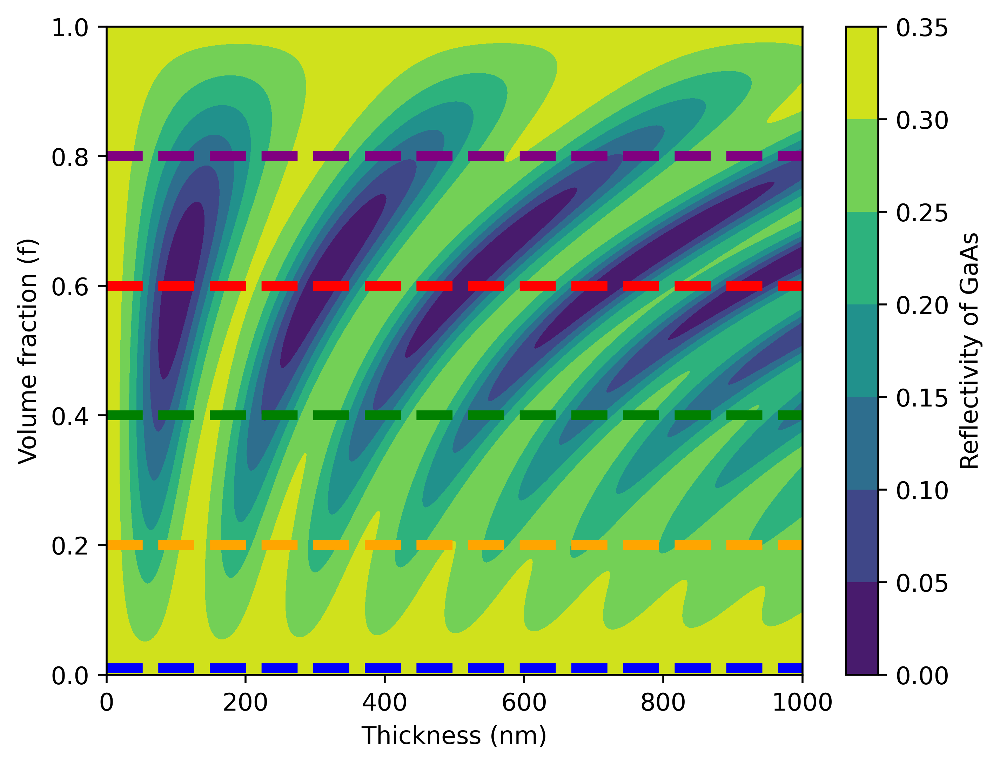

In [11]:
plt.figure(dpi=500)
plt.contourf(vfplot,hplot,Rgaas)
plt.colorbar(label='Reflectivity of GaAs')
plt.axhline(y=0.01, color='blue', ls='--', linewidth='4')
plt.axhline(y=0.2, color='orange', ls='--', linewidth='4')
plt.axhline(y=0.4, color='green', ls='--', linewidth='4')
plt.axhline(y=0.6, color='red', ls='--', linewidth='4')
plt.axhline(y=0.8, color='purple', ls='--', linewidth='4')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')

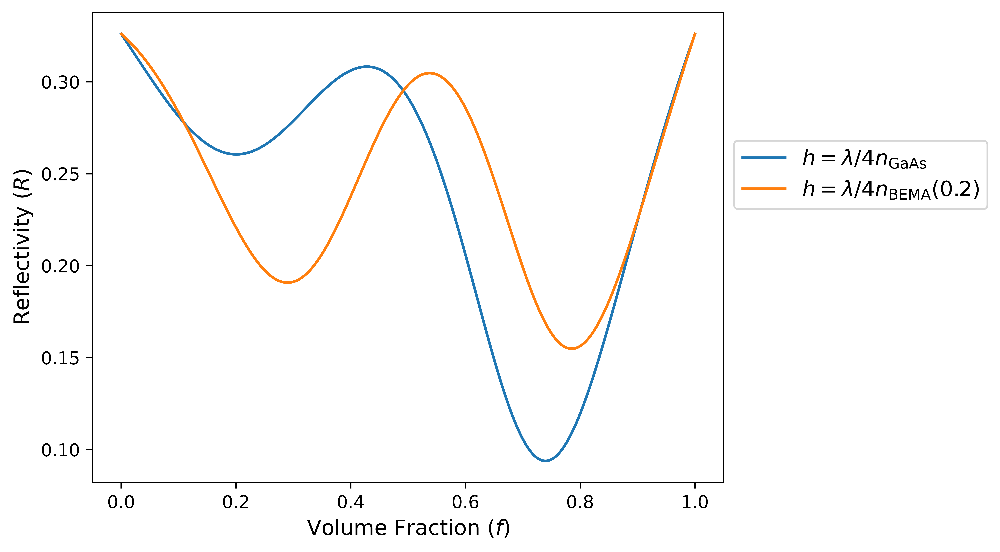

In [12]:
plt.figure(dpi=1000)
ng1=780*3/(4*Nbrugger(ngaas,0))
ng2=780*3/(4*Nbrugger(ngaas,0.2))
ng3=780*3/(4*Nbrugger(ngaas,0.4))
ng4=780*3/(4*Nbrugger(ngaas,0.6))
ng5=780*3/(4*Nbrugger(ngaas,0.8))
#ng66=780*3/(4*Nbrugger(0.607))
nindex1=round(abs(ng1))
nindex2=round(abs(ng2))
nindex3=round(abs(ng3))
nindex4=round(abs(ng4))
nindex5=round(abs(ng5))
#nindex6=round(abs(ng66))

#plt.yscale('log')
plt.plot(fgr,Rgaas[nindex1,:], label=r"$h={\lambda}/{4n_{\mathrm{GaAs}}}$")
plt.plot(fgr,Rgaas[nindex2,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.2)}$" )
#plt.plot(fgr,Rgaas[nindex3,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.4)}$")
#plt.plot(fgr,Rgaas[nindex4,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.6)}$")
#plt.plot(fgr,Rgaas[nindex5,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.8)}$")
#plt.plot(fgr,R[nindex6,:], label="f=0.605")
#plt.plot(ff,(Rf5), label="h = 990nm")

#plt.axvline(0.66, linewidth=1, color='black', linestyle='--')
plt.ylabel("Reflectivity ($R$)",fontsize=12)
plt.xlabel("Volume Fraction ($f$)" ,fontsize=12)
#plt.title("Using $h=\frac{\lambda}{4n_{BEMA}(0.2)}$" ,fontsize=12)
plt.legend(bbox_to_anchor=(1,0.75),prop={'size':12})

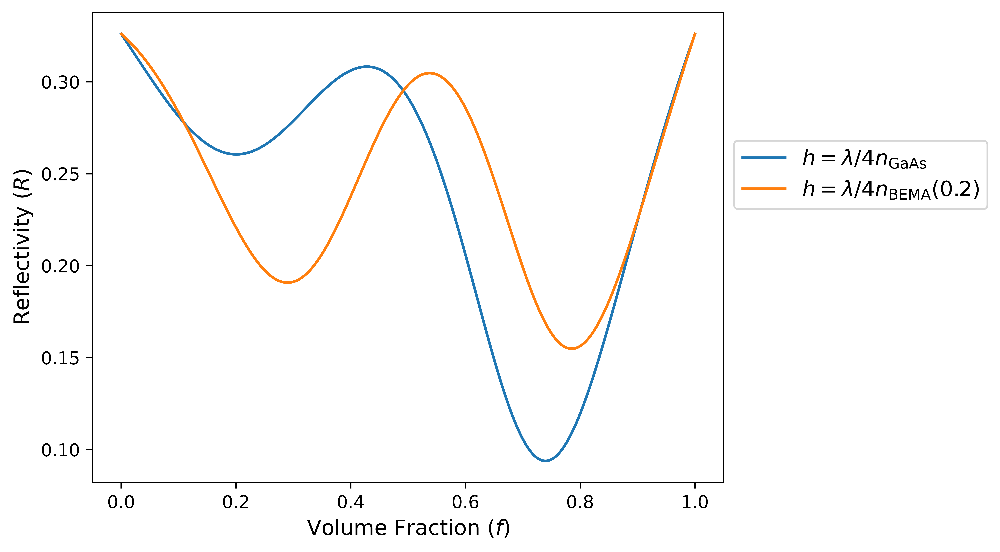

In [13]:
plt.figure(dpi=1000)
ng1=780*3/(4*Nbrugger(ngaas,0))
ng2=780*3/(4*Nbrugger(ngaas,0.2))
ng3=780*3/(4*Nbrugger(ngaas,0.4))
ng4=780*3/(4*Nbrugger(ngaas,0.6))
ng5=780*3/(4*Nbrugger(ngaas,0.8))
#ng66=780*3/(4*Nbrugger(0.607))
nindex1=round(abs(ng1))
nindex2=round(abs(ng2))
nindex3=round(abs(ng3))
nindex4=round(abs(ng4))
nindex5=round(abs(ng5))
#nindex6=round(abs(ng66))

#plt.yscale('log')
plt.plot(fgr,Rgaas[nindex1,:], label=r"$h={\lambda}/{4n_{\mathrm{GaAs}}}$")
plt.plot(fgr,Rgaas[nindex2,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.2)}$" )
#plt.plot(fgr,Rgaas[nindex3,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.4)}$")
#plt.plot(fgr,Rgaas[nindex4,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.6)}$")
#plt.plot(fgr,Rgaas[nindex5,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(0.8)}$")
#plt.plot(fgr,R[nindex6,:], label="f=0.605")
#plt.plot(ff,(Rf5), label="h = 990nm")

#plt.axvline(0.66, linewidth=1, color='black', linestyle='--')
plt.ylabel("Reflectivity ($R$)",fontsize=12)
plt.xlabel("Volume Fraction ($f$)" ,fontsize=12)
#plt.title("Using $h=\frac{\lambda}{4n_{BEMA}(0.2)}$" ,fontsize=12)
plt.legend(bbox_to_anchor=(1,0.75),prop={'size':12})

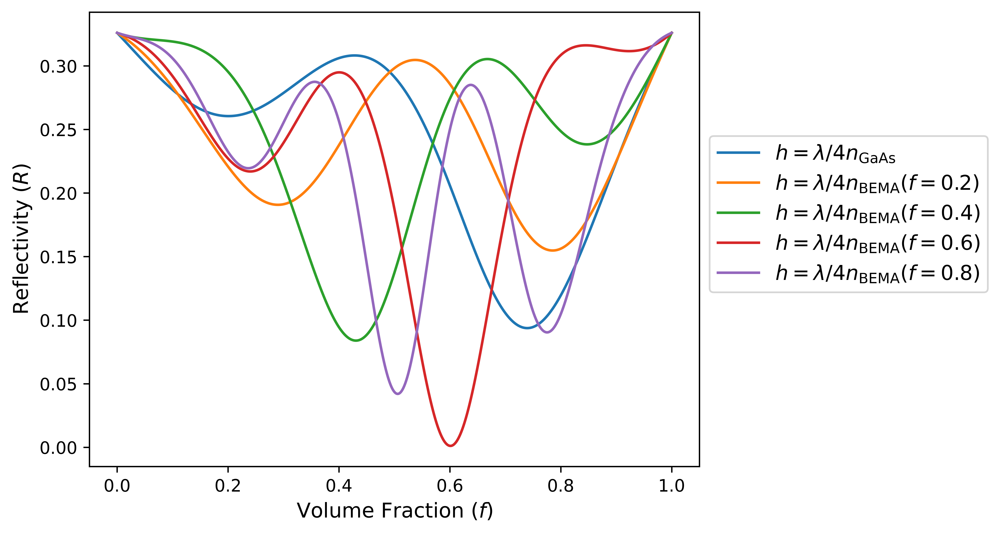

In [14]:
plt.figure(dpi=1000)
ng1=780*3/(4*Nbrugger(ngaas,0))
ng2=780*3/(4*Nbrugger(ngaas,0.2))
ng3=780*3/(4*Nbrugger(ngaas,0.4))
ng4=780*3/(4*Nbrugger(ngaas,0.6))
ng5=780*3/(4*Nbrugger(ngaas,0.8))
#ng66=780*3/(4*Nbrugger(0.607))
nindex1=round(abs(ng1))
nindex2=round(abs(ng2))
nindex3=round(abs(ng3))
nindex4=round(abs(ng4))
nindex5=round(abs(ng5))
#nindex6=round(abs(ng66))

#plt.yscale('log')
plt.plot(fgr,Rgaas[nindex1,:], label=r"$h={\lambda}/{4n_{\mathrm{GaAs}}}$")
plt.plot(fgr,Rgaas[nindex2,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.2)}$" )
plt.plot(fgr,Rgaas[nindex3,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.4)}$")
plt.plot(fgr,Rgaas[nindex4,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.6)}$")
plt.plot(fgr,Rgaas[nindex5,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.8)}$")
#plt.plot(fgr,R[nindex6,:], label="f=0.605")
#plt.plot(ff,(Rf5), label="h = 990nm")

#plt.axvline(0.66, linewidth=1, color='black', linestyle='--')
plt.ylabel("Reflectivity ($R$)",fontsize=12)
plt.xlabel("Volume Fraction ($f$)" ,fontsize=12)
#plt.title("Using $h=\frac{\lambda}{4n_{BEMA}(0.2)}$" ,fontsize=12)
plt.legend(bbox_to_anchor=(1,0.75),prop={'size':12})

[0.32598854 0.32598807 0.32598671 ... 0.3256903  0.32568734 0.32568453]


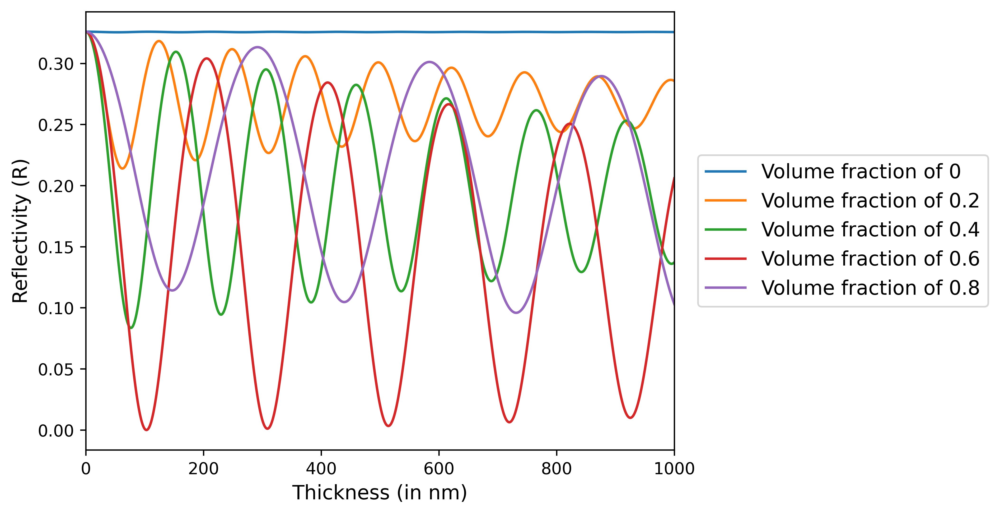

In [15]:
hgr=np.linspace(0,1000,1001)
fgr=np.linspace(0,1.0,1001)

plt.figure(dpi=500)
#plt.yscale('log')
plt.plot(hgr,Rgaas[:,1], label="Volume fraction of 0")
plt.plot(hgr,Rgaas[:,200], label="Volume fraction of 0.2")
plt.plot(hgr,Rgaas[:,400], label="Volume fraction of 0.4")
plt.plot(hgr,Rgaas[:,600], label="Volume fraction of 0.6")
plt.plot(hgr,Rgaas[:,800], label="Volume fraction of 0.8")
plt.xlabel("Thickness (in nm)",fontsize=12)
plt.ylabel("Reflectivity (R)",fontsize=12)
plt.legend(loc='right',bbox_to_anchor=(1.55,0.5),prop={'size':12})
plt.xlim(0,1e3)
#print(min(Rgaas[:,600]))
#plt.axvline(103e-9, linewidth=1, color='black', linestyle='--')
#plt.axvline(308e-9, linewidth=1, color='black', linestyle='--')
print(Rgaas[:,1])

(0.0, 1000.0)

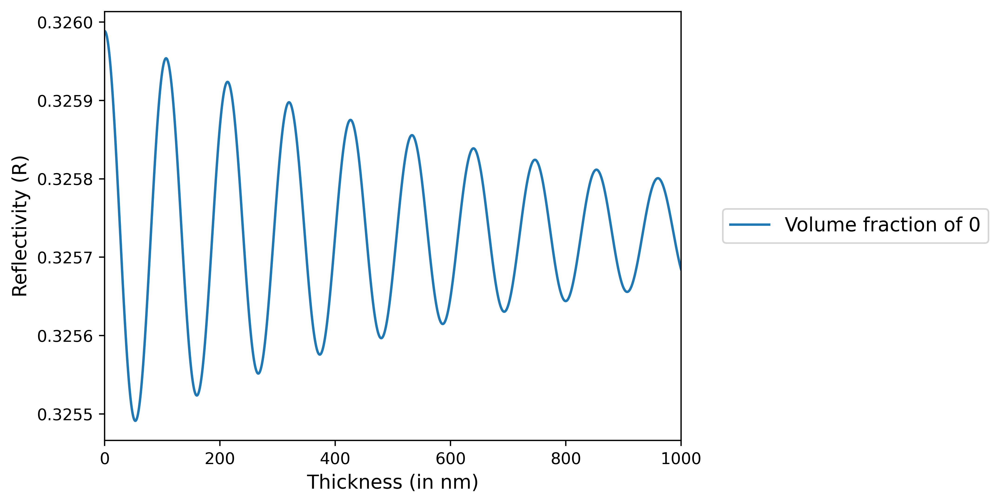

In [16]:
plt.figure(dpi=500)
#plt.yscale('log')
plt.plot(hgr,Rgaas[:,1], label="Volume fraction of 0")
#plt.plot(hgr,Rgaas[:,200], label="Volume fraction of 0.2")
#plt.plot(hgr,Rgaas[:,400], label="Volume fraction of 0.4")
#plt.plot(hgr,Rgaas[:,600], label="Volume fraction of 0.6")
#plt.plot(hgr,Rgaas[:,800], label="Volume fraction of 0.8")
plt.xlabel("Thickness (in nm)",fontsize=12)
plt.ylabel("Reflectivity (R)",fontsize=12)
plt.legend(loc='right',bbox_to_anchor=(1.55,0.5),prop={'size':12})
plt.xlim(0,1e3)
#print(min(Rgaas[:,600]))
#plt.axvline(103e-9, linewidth=1, color='black', linestyle='--')
#plt.axvline(308e-9, linewidth=1, color='black', linestyle='--')

(0.0, 1000.0)

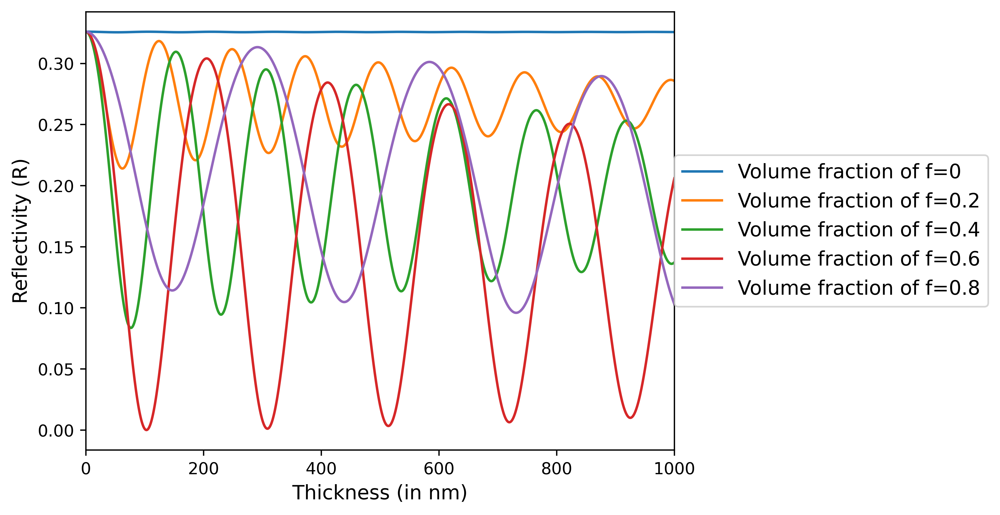

In [17]:
plt.figure(dpi=500)
#plt.yscale('log')
plt.plot(hgr,Rgaas[:,1], label="Volume fraction of f=0")
plt.plot(hgr,Rgaas[:,200], label="Volume fraction of f=0.2")
plt.plot(hgr,Rgaas[:,400], label="Volume fraction of f=0.4")
plt.plot(hgr,Rgaas[:,600], label="Volume fraction of f=0.6")
plt.plot(hgr,Rgaas[:,800], label="Volume fraction of f=0.8")
plt.xlabel("Thickness (in nm)",fontsize=12)
plt.ylabel("Reflectivity (R)",fontsize=12)
plt.legend(loc='right',bbox_to_anchor=(1.55,0.5),prop={'size':12})
plt.xlim(0,1e3)
#print(min(Rgaas[:,600]))
#plt.axvline(103e-9, linewidth=1, color='black', linestyle='--')
#plt.axvline(308e-9, linewidth=1, color='black', linestyle='--')

Text(0.5, 0, 'Thickness (nm)')

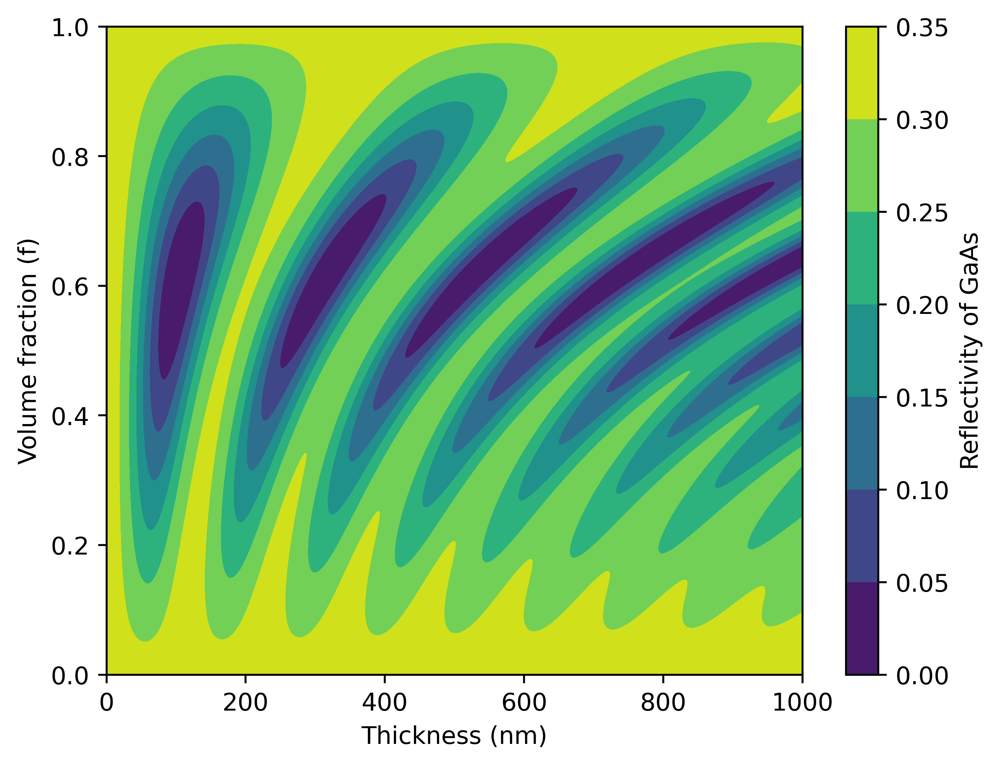

In [18]:
vf=np.linspace(0,1000,1001)
hh=np.linspace(0,1.0,1001)
hplot,vfplot=np.meshgrid(hh,vf)

plt.figure(dpi=500)
plt.contourf(vfplot,hplot,Rgaas)
plt.colorbar(label='Reflectivity of GaAs')
#plt.axhline(y=0.001, color='blue', ls='--')
#plt.axhline(y=0.2, color='orange', ls='--')
#plt.axhline(y=0.4, color='green', ls='--')
#plt.axhline(y=0.6, color='red', ls='--')
#plt.axhline(y=0.8, color='purple', ls='--')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')

In [19]:
hinas=np.linspace(0,1000e-9,1001)
finas=np.linspace(0,1.0,1001)
thickness_inas,volume_fraction_inas=np.meshgrid(hinas,finas)
Rinas=np.zeros([len(thickness_inas),len(volume_fraction_inas)])
for i in range(len(thickness_inas)):
    for j in range(len(volume_fraction_inas)):
        Rinas[i,j]=Reflectivity("s",nair,ninas,ninas,wavelength,hinas[i],0,finas[j])

Text(0.5, 0, 'Thickness (nm)')

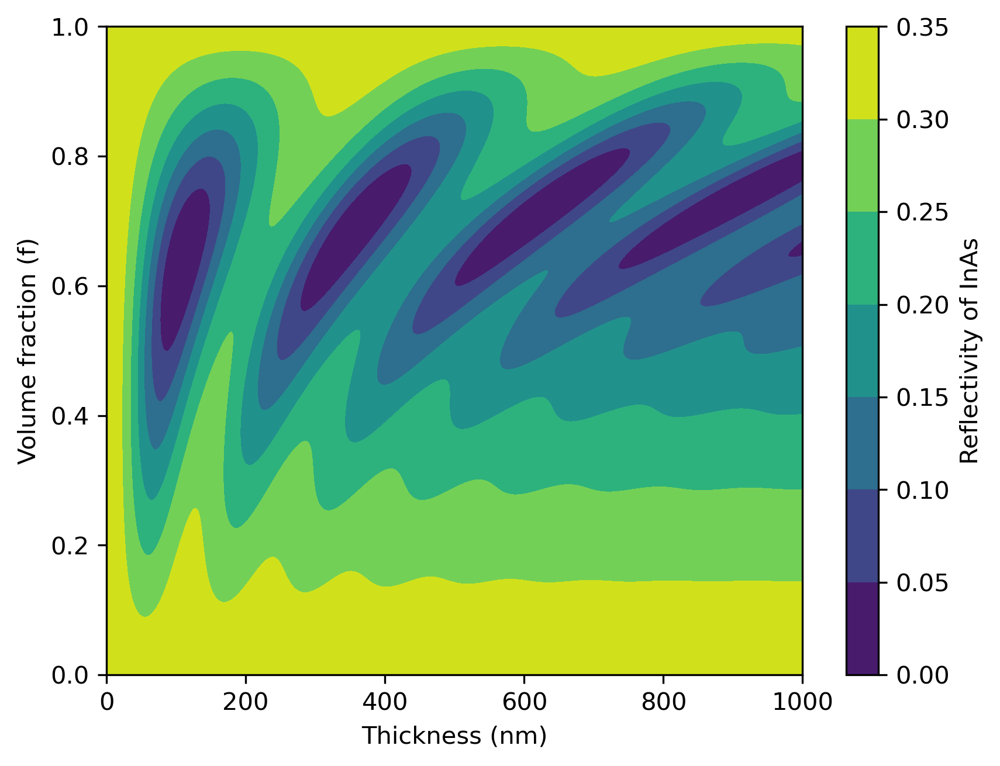

In [20]:
plt.figure(dpi=300)
plt.contourf(vfplot,hplot,Rinas)
plt.colorbar(label='Reflectivity of InAs')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')

In [21]:
minima_inas = (Rinas == minimum_filter(Rinas, 10, mode='constant', cval=0.0))
res_inas = np.where(1 == minima_inas)
print(res_inas)
print(Rinas[109,640])
print(Rinas[356,690])
print(Rinas[628,720])
print(Rinas[917,740])
print(Rinas[628,800])

(array([109, 356, 628, 917]), array([637, 687, 719, 742]))
7.181634175184249e-05
0.0001936345965200211
6.815121941622425e-05
0.00031575506581345747
0.18743023486716742


In [22]:
np.amin(Rinas)
print(np.unravel_index(Rinas.argmin(), Rinas.shape))

(109, 637)


In [23]:
np.amin(Rinas)
print(np.unravel_index(Rgaas.argmin(), Rgaas.shape))

(778, 645)


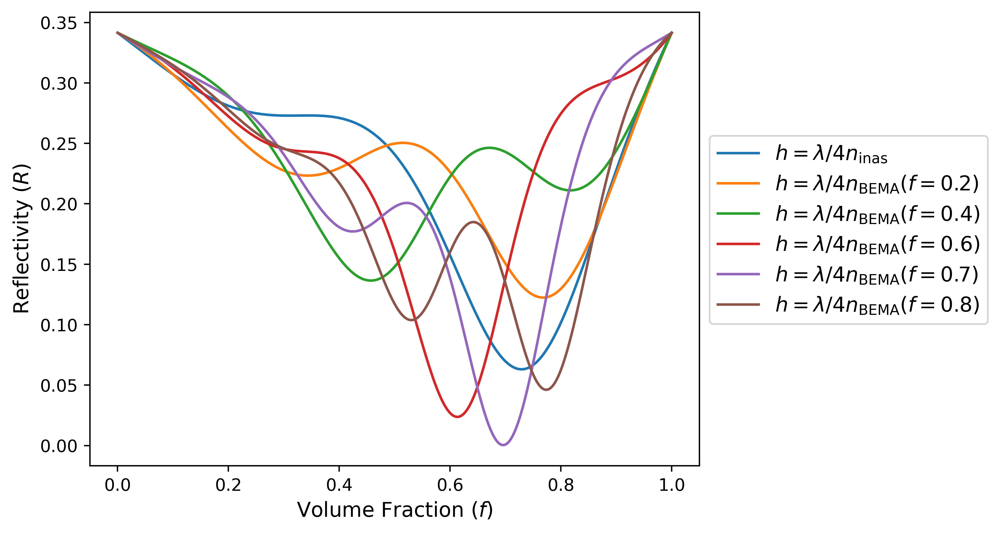

In [24]:
plt.figure(dpi=500)
ni1=780*3/(4*Nbrugger(ninas,0))
ni2=780*3/(4*Nbrugger(ninas,0.2))
ni3=780*3/(4*Nbrugger(ninas,0.4))
ni4=780*3/(4*Nbrugger(ninas,0.6))
ni5=780*3/(4*Nbrugger(ninas,0.8))
ni6=780*3/(4*Nbrugger(ninas,0.7))
#ng66=780*3/(4*Nbrugger(0.607))
niindex1=round(abs(ni1))
niindex2=round(abs(ni2))
niindex3=round(abs(ni3))
niindex4=round(abs(ni4))
niindex5=round(abs(ni5))
niindex6=round(abs(ni6))
#nindex6=round(abs(ng66))

#plt.yscale('log')
plt.plot(fgr,Rinas[niindex1,:], label=r"$h={\lambda}/{4n_{\mathrm{inas}}}$")
plt.plot(fgr,Rinas[niindex2,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.2)}$" )
plt.plot(fgr,Rinas[niindex3,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.4)}$")
plt.plot(fgr,Rinas[niindex4,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.6)}$")
plt.plot(fgr,Rinas[niindex6,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.7)}$")
plt.plot(fgr,Rinas[niindex5,:], label=r"$h={\lambda}/{4n_{\mathrm{BEMA}}(f=0.8)}$")
#plt.plot(fgr,R[nindex6,:], label="f=0.605")
#plt.plot(ff,(Rf5), label="h = 990nm")

#plt.axvline(0.66, linewidth=1, color='black', linestyle='--')
plt.ylabel("Reflectivity ($R$)",fontsize=12)
plt.xlabel("Volume Fraction ($f$)" ,fontsize=12)
#plt.title("Using $h=\frac{\lambda}{4n_{BEMA}(0.2)}$" ,fontsize=12)
plt.legend(bbox_to_anchor=(1,0.75),prop={'size':12})

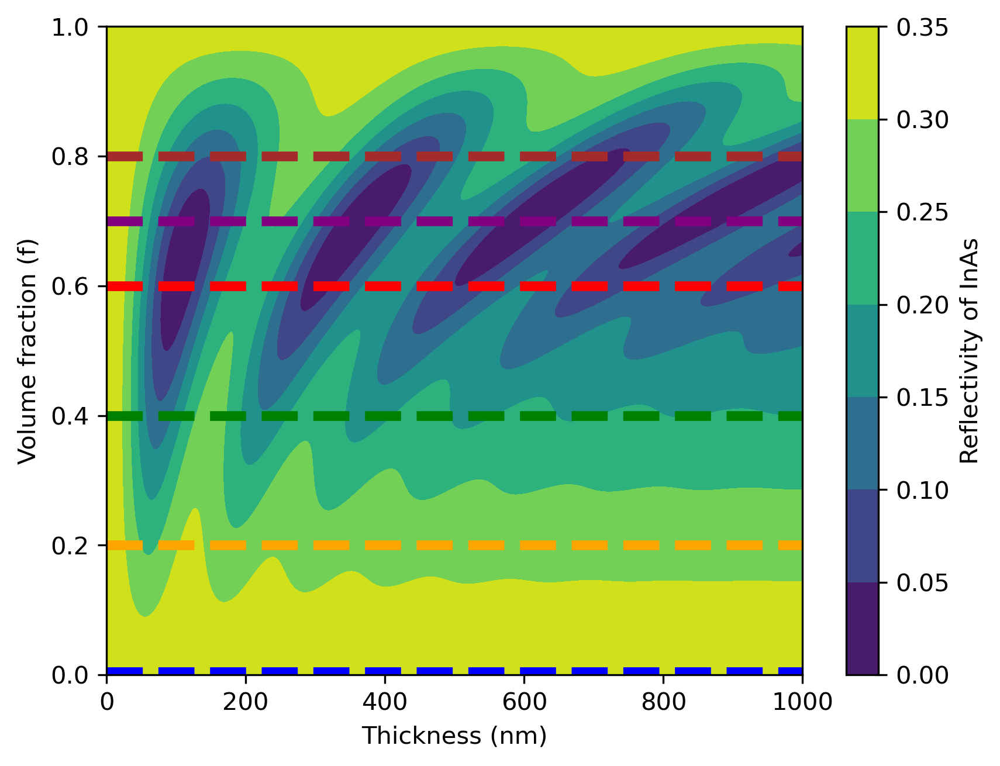

In [25]:
plt.figure(dpi=300)
plt.contourf(vfplot,hplot,Rinas)
plt.colorbar(label='Reflectivity of InAs')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')
plt.axhline(y=0.005, color='blue', ls='--', linewidth='4')
plt.axhline(y=0.2, color='orange', ls='--', linewidth='4')
plt.axhline(y=0.4, color='green', ls='--', linewidth='4')
plt.axhline(y=0.6, color='red', ls='--', linewidth='4')
plt.axhline(y=0.8, color='brown', ls='--', linewidth='4')
plt.axhline(y=0.7, color='purple', ls='--', linewidth='4')


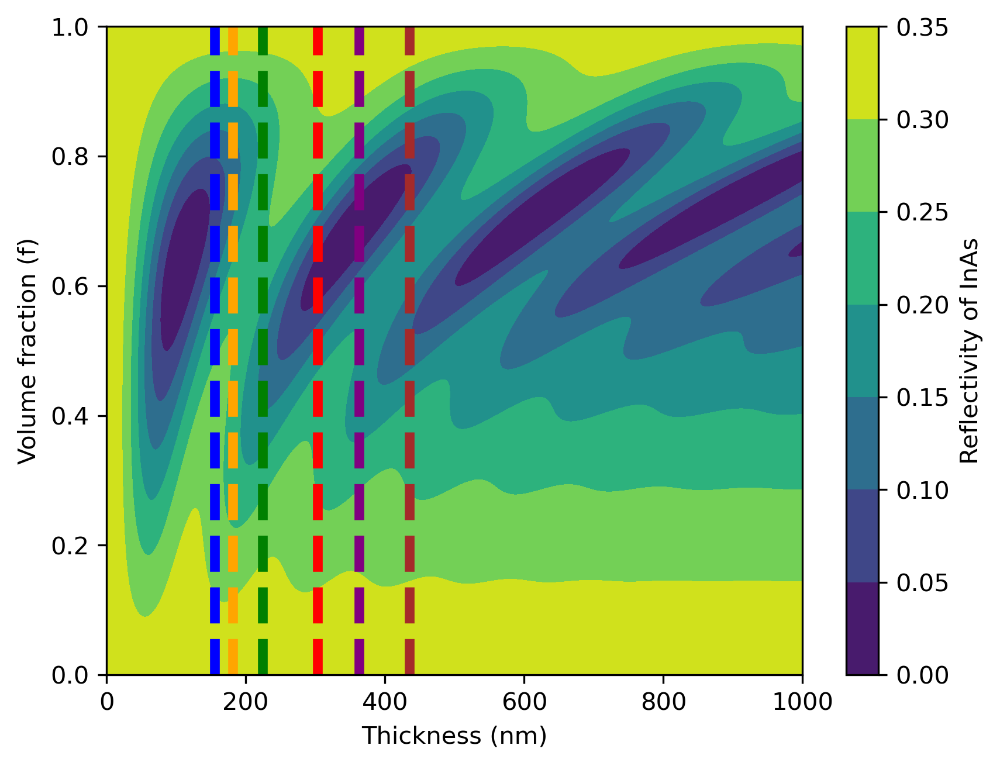

In [26]:
plt.figure(dpi=300)
plt.contourf(vfplot,hplot,Rinas)
plt.colorbar(label='Reflectivity of InAs')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')
plt.axvline(x=niindex1, color='blue', ls='--', linewidth='4')
plt.axvline(x=niindex2, color='orange', ls='--', linewidth='4')
plt.axvline(x=niindex3, color='green', ls='--', linewidth='4')
plt.axvline(x=niindex4, color='red', ls='--', linewidth='4')
plt.axvline(x=niindex6, color='purple', ls='--', linewidth='4')
plt.axvline(x=niindex5, color='brown', ls='--', linewidth='4')


0.004481475311199514


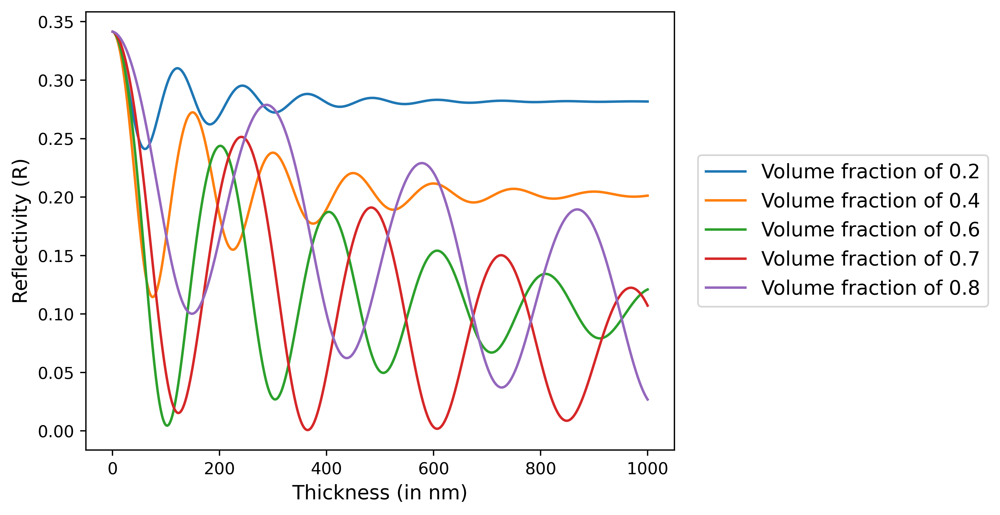

In [27]:
hgr=np.linspace(0,1000,1001)
fgr=np.linspace(0,1.0,1001)

plt.figure(dpi=500)
#plt.yscale('log')
plt.plot(hgr,Rinas[:,200], label="Volume fraction of 0.2")
plt.plot(hgr,Rinas[:,400], label="Volume fraction of 0.4")
plt.plot(hgr,Rinas[:,600], label="Volume fraction of 0.6")
plt.plot(hgr,Rinas[:,700], label="Volume fraction of 0.7")
plt.plot(hgr,Rinas[:,800], label="Volume fraction of 0.8")
plt.xlabel("Thickness (in nm)",fontsize=12)
plt.ylabel("Reflectivity (R)",fontsize=12)
plt.legend(loc='right',bbox_to_anchor=(1.55,0.5),prop={'size':12})
#plt.xlim(0,1e6)
print(min(Rinas[:,600]))
#plt.axvline(103e-9, linewidth=1, color='black', linestyle='--')
#plt.axvline(308e-9, linewidth=1, color='black', linestyle='--')

In [28]:
res_inasthick = (Rinas[:,600] == minimum_filter(Rinas[:,600], 10, mode='constant', cval=0.0))
minima_inasthick = np.where(1 == res_inasthick)
print(minima_inasthick)

(array([102, 304, 506, 708, 911]),)


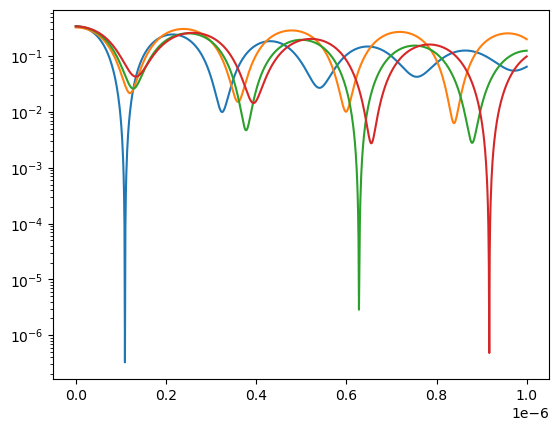

In [29]:
plt.yscale('log')
plt.plot(hinas,Rinas[:,637])
plt.plot(hinas,Rgaas[:,687])
plt.plot(hinas,Rinas[:,719])
plt.plot(hinas,Rinas[:,742])

In [30]:
t=np.linspace(-0.75*1e-12,2*1e-12, 1000)


E_bias = 10 #bias voltage
eta = 900e3 #geometrical factor


#GaAs
alpha_gaas = 1448600 #optical absorption coefficent gaas
mu_gaas = 500
epsilon_gaas = 13.384*8.854e-12

#InAs
alpha_inas = 7410000 #absorption coeff inas
mu_inas = 1000
epsilon_inas = 13.858*8.854e-12


q=1.60217657e-19 #charge of electron
mu_e=350

eta=900e3 
epsilon=13.384*8.854e-12 #use papatryfonos

tau_c = 1e-12 #picosecond carrier lifetime
tau_r = 100e-12 #recombintation time
tau_l=0.1e-12 #laser duration
#parameters for G

#R = 0.318  #reflection coefficient in air-semiconductor interface
alpha = 1360357.951#1448600 #optical absorption coefficent
v_opt = 100e8 #laserfrequency

d_0 = 1/alpha #antenna gap depth
omega_0 = 1e-6 #laser beam waist
P_0 = 0.01 #laser peak power
h=6.62607015e-34

r = omega_0#1.6199e-6 #optical beam radius

#antenna active volume
W = 10e-6 #antenna gap width
L = 5e-6 #antenna gap length
V = W*L*d_0
#G proper laser equation
#eta_electron = (1-R)*(1-np.exp(-alpha*d_0))
#P_t_r = P_0*(1-np.exp(-(2*r**2)/(omega_0**2)))*(np.exp(-(2*t**2)/(tau_l**2))) 
#G = ((2*eta_electron)/(V*h*v_opt))*(P_t_r) #generation rate of photocarriers

E=1
E_bias = 10


def param(y, t, R, tau_l, tau_c, tau_r, mu_e, alpha, epsilon):
    eta_electron = (1-R)*(1-np.exp(-alpha*d_0))
    P_t_r = P_0*(1-np.exp(-(2*r**2)/(omega_0**2)))*(np.exp(-(2*t**2)/(tau_l**2))) 
    G = ((2*eta_electron)/(V*h*v_opt))*(P_t_r) #generation rate of photocarriers
    dn_tdt = - y[0] / tau_c + G
    dvg=(E_bias-y[1]*(1+(q*y[0]*mu_e*tau_r)/(eta*epsilon)))/tau_r
    return np.array([dn_tdt,dvg])

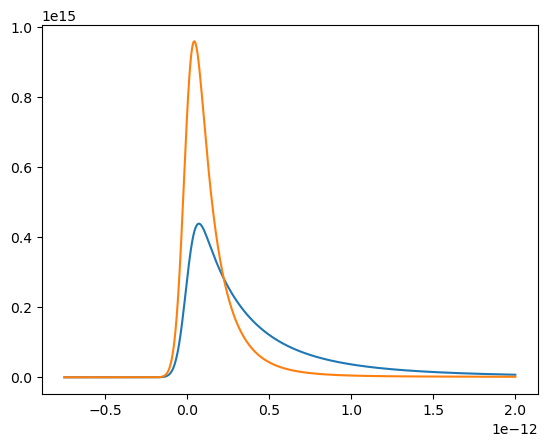

In [31]:
y0=np.zeros([2])
y0[0]= 0
y0[1]= E_bias

def gaasJ(Rgaas, tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas):
    solgaas=odeint(param,y0,t, args=(Rgaas, tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas))
    ntgaas=solgaas[:,0]
    vggaas=solgaas[:,1]
    jgaas=q*ntgaas*mu_gaas*(vggaas/L)
    return jgaas

def inasJ(Rinas, tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas):
    solinas=odeint(param,y0,t, args=(Rinas, tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas))
    ntinas=solinas[:,0]
    vginas=solinas[:,1]
    jinas=q*ntinas*mu_inas*(vginas/L)
    return jinas

jgaas=gaasJ(Rgaas[1,1], tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas)
jinas=inasJ(Rinas[1,1], tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas)

gradgaas=np.gradient(jgaas)
gradinas=np.gradient(jinas)
plt.plot(t,jgaas)
plt.plot(t,jinas)

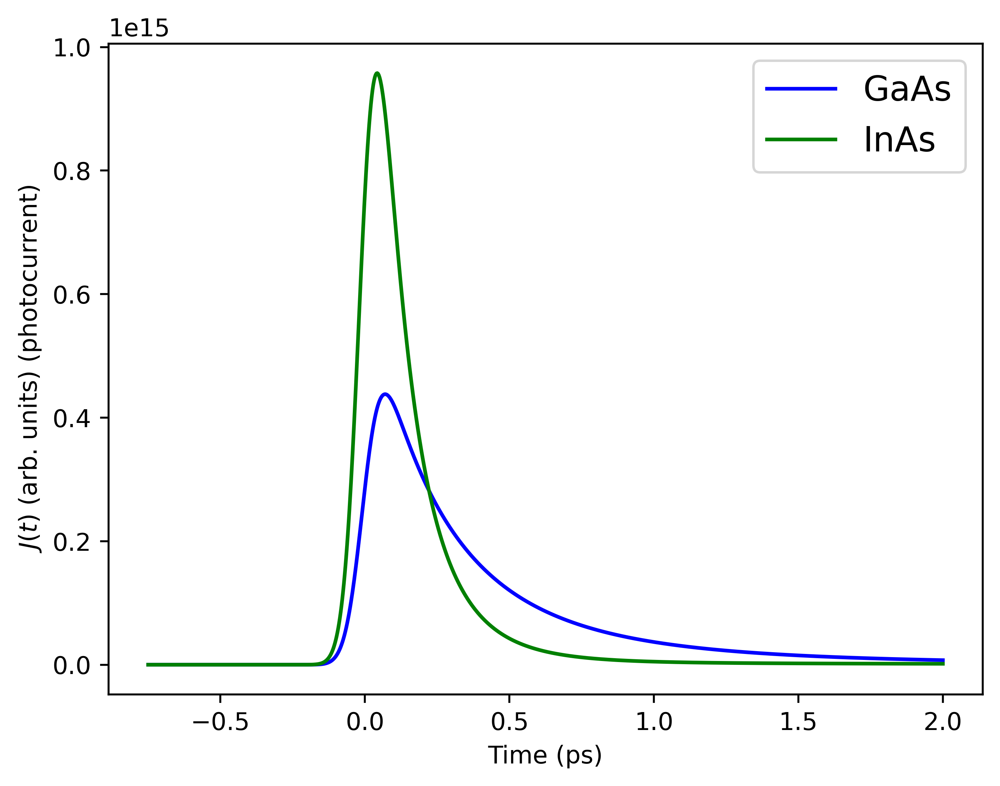

In [32]:
tplot=np.linspace(-0.75,2, 1000)
plt.figure(dpi=500)
#plt.plot(tplot,gradjt, label=r'$f=0$ (non-texturized)')
plt.plot(tplot,jgaas,'b', label='GaAs')
plt.plot(tplot,jinas,'g',label=r'InAs')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$J(t)$ (arb. units) (photocurrent)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})

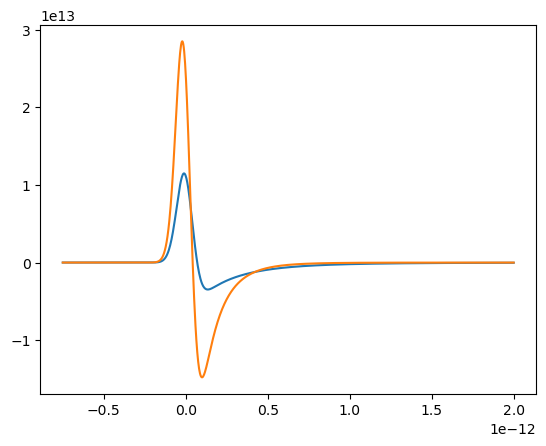

In [33]:
plt.plot(t,gradgaas)
plt.plot(t,gradinas)

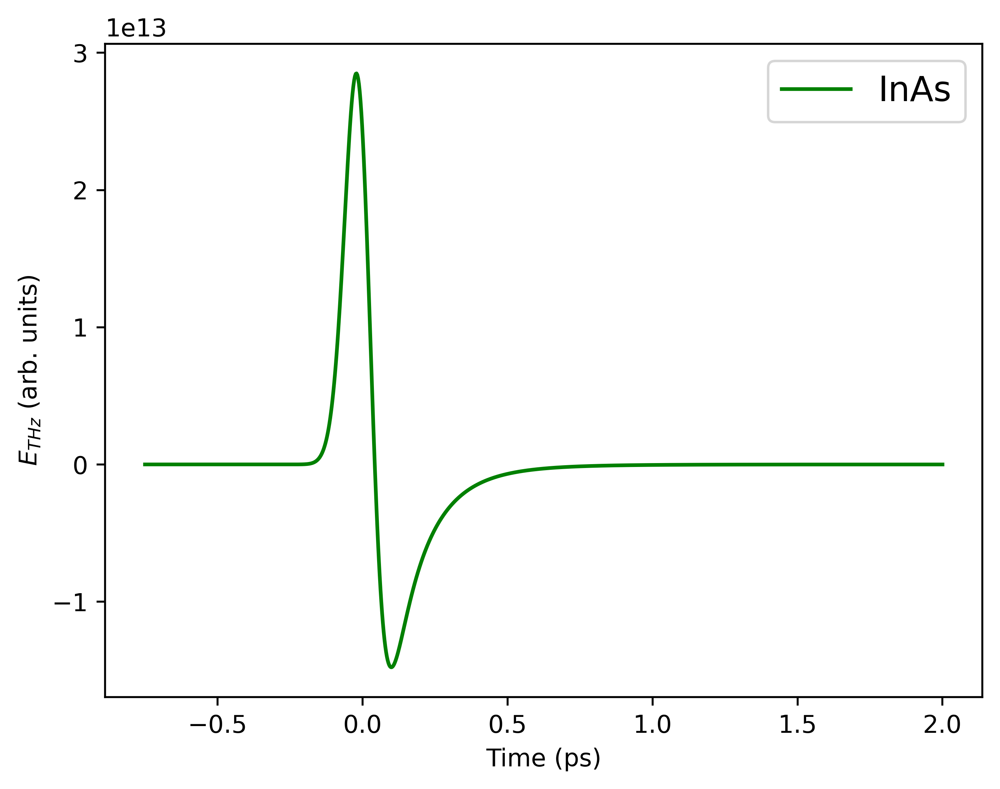

In [34]:


plt.figure(dpi=500)
#plt.plot(tplot,gradjt, label=r'$f=0$ (non-texturized)')
plt.plot(tplot,gradinas,'g', label='InAs')
#plt.plot(tplot,gradjt1, label=r'$f=0.4$')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})

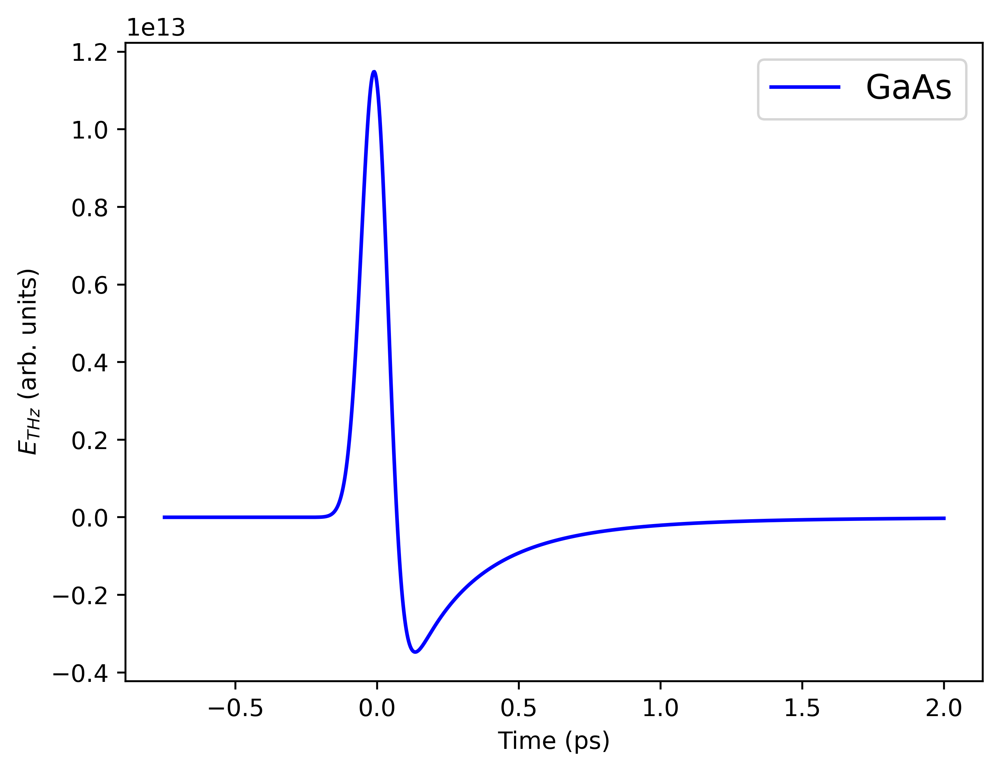

In [35]:


plt.figure(dpi=500)
#plt.plot(tplot,gradjt, label=r'$f=0$ (non-texturized)')
plt.plot(tplot,gradgaas,'b', label='GaAs')
#plt.plot(tplot,gradjt1, label=r'$f=0.4$')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})

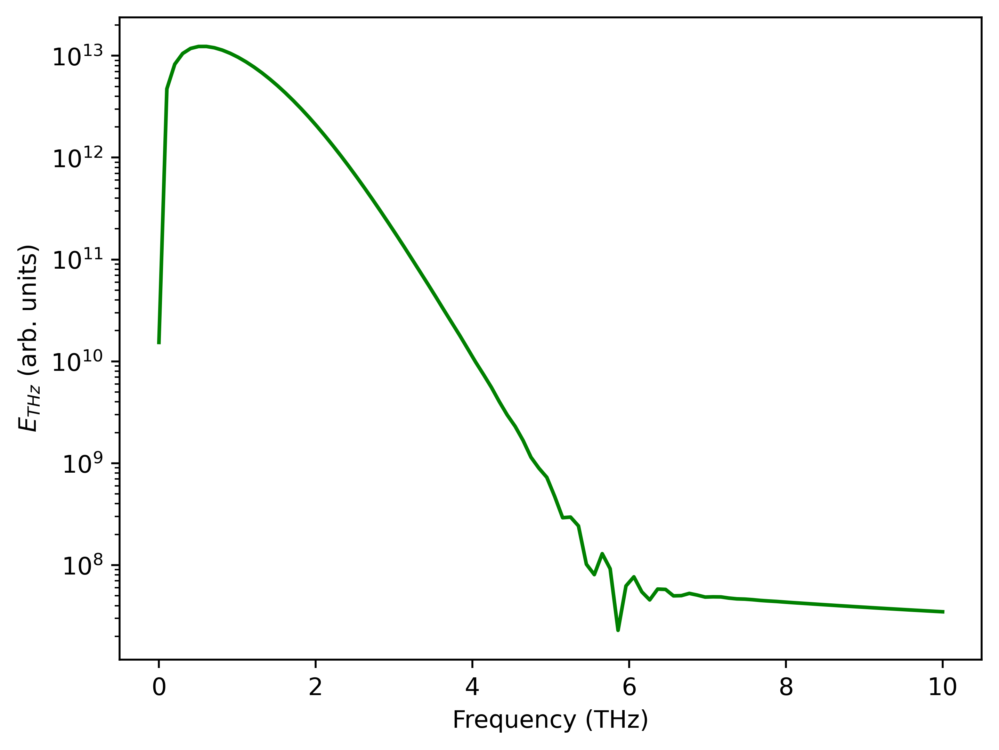

In [36]:
sample_rate = 100
N = (2 - 0) * sample_rate
frequency = np.linspace (0.0, 10, int (N/2))

freq_data = fft(gradinas)
y = 2/N * np.abs (freq_data [0:int (N/2)])
plt.figure(dpi=500)
plt.xlabel("Frequency (THz)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
plt.semilogy(frequency,y,'g',label='GaAs')

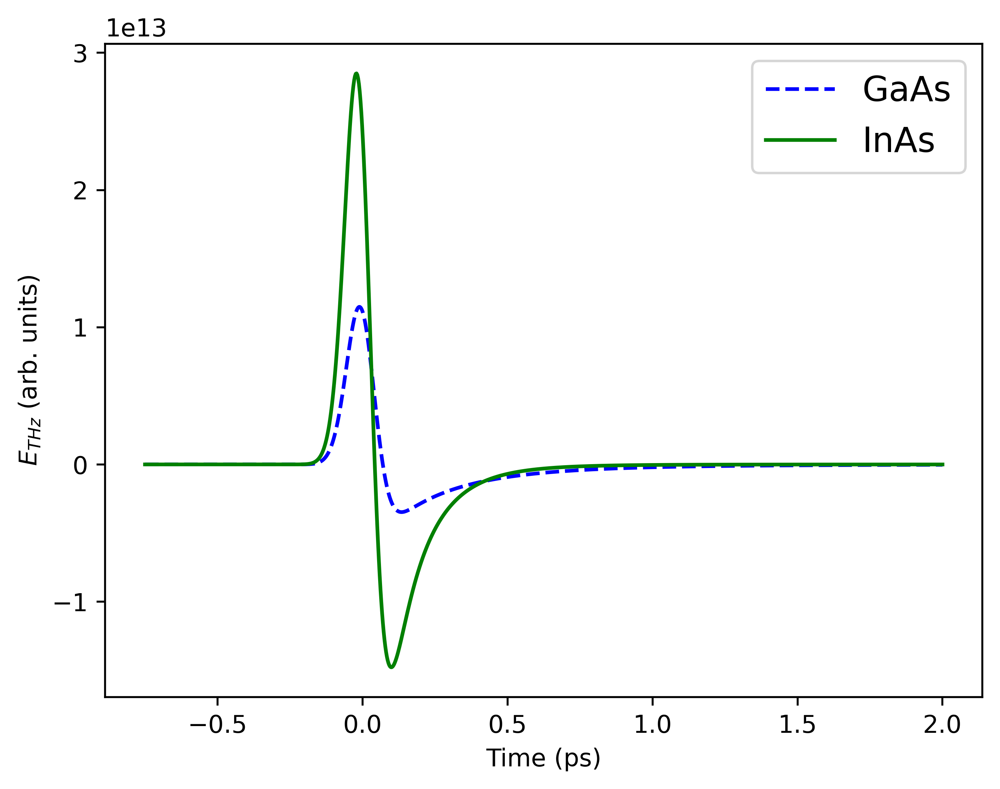

In [37]:
plt.figure(dpi=500)
#plt.plot(tplot,gradjt, label=r'$f=0$ (non-texturized)')
plt.plot(tplot,gradgaas,'--b', label='GaAs')
plt.plot(tplot,gradinas,'g',label=r'InAs')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})

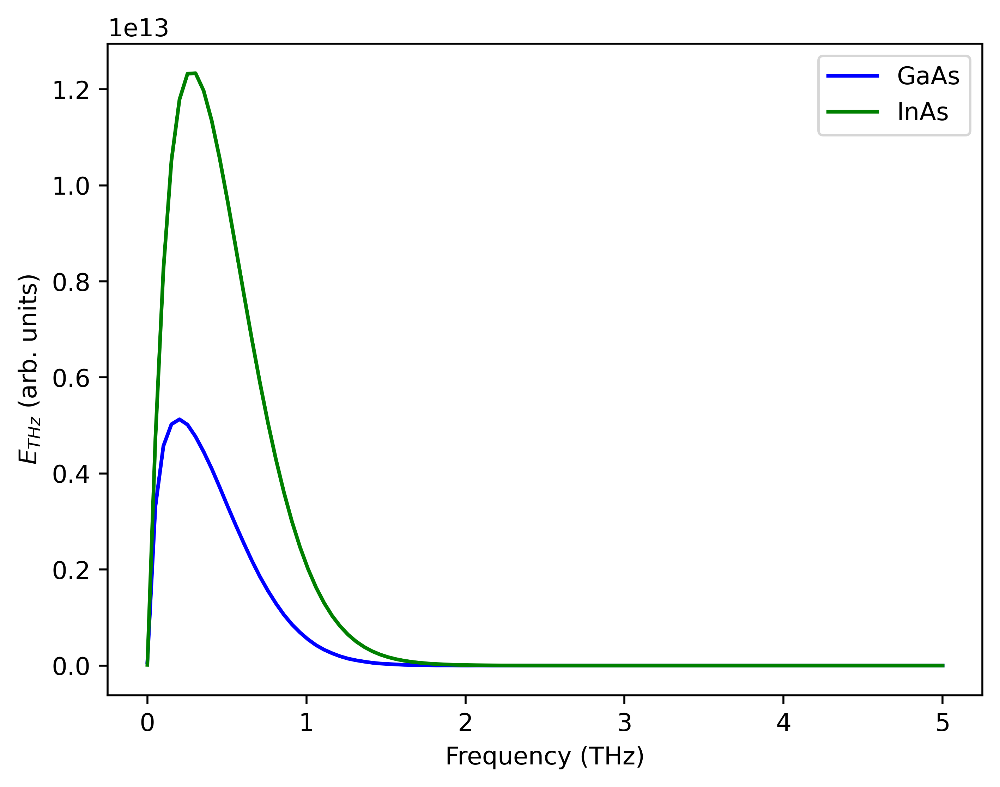

In [38]:
sample_rate = 100
N = (2 - 0) * sample_rate
frequency = np.linspace (0.0, 5, int (N/2))

freq_datagaas = fft(gradgaas)
freq_datainas = fft(gradinas)
yg = 2/N * np.abs (freq_datagaas [0: int (N/2)])
yi = 2/N * np.abs (freq_datainas [0: int (N/2)])
plt.figure(dpi=500)
#plt.yscale('log')
plt.xlabel("Frequency (THz)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
plt.plot(frequency,yg,'b',label='GaAs')
plt.plot(frequency,yi,'g',label='InAs')
plt.legend()

14957039000214.875
22117625486694.47


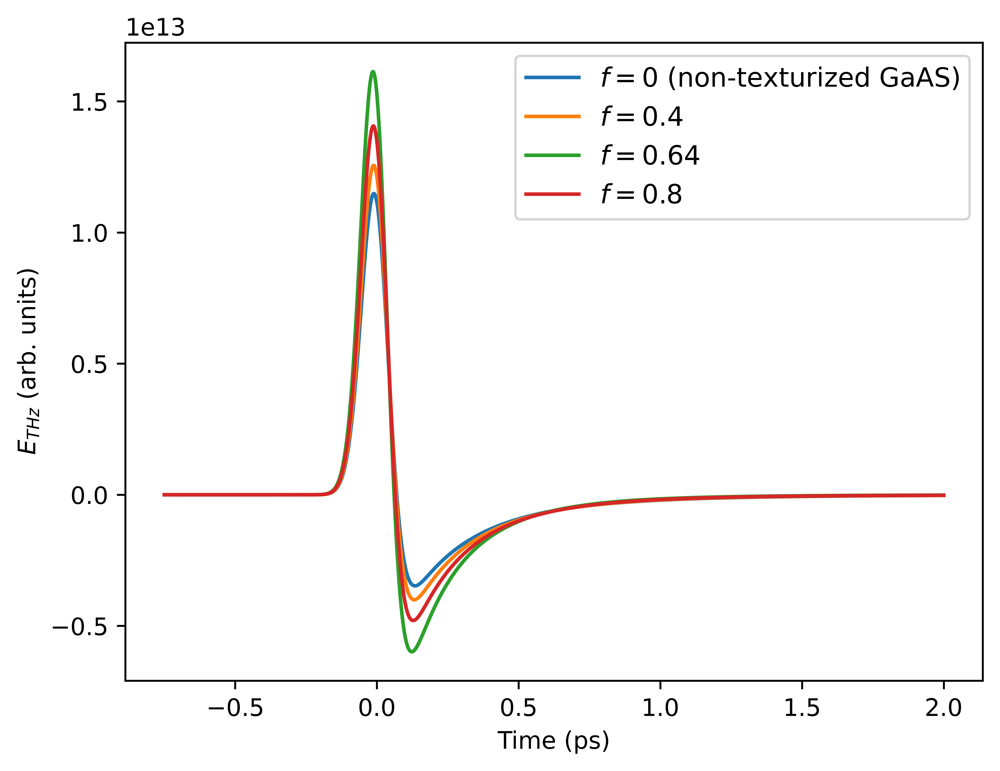

In [39]:
tplot=np.linspace(-0.75,2, 1000)

jtt=gaasJ(Rgaas[778,0], tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas)
jtt1=gaasJ(Rgaas[778,400], tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas)
jtt2=gaasJ(Rgaas[778,640], tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas)
jtt3=gaasJ(Rgaas[778,800], tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas)

gradjt=np.gradient(jtt)
gradjt1=np.gradient(jtt1)
gradjt2=np.gradient(jtt2)
gradjt3=np.gradient(jtt3)

plt.figure(dpi=1000)
plt.plot(tplot,gradjt, label=r'$f=0$ (non-texturized GaAS)')
#plt.plot(tplot,gradjt, label=r'GaAs')
plt.plot(tplot,gradjt1, label=r'$f=0.4$')
plt.plot(tplot,gradjt2, label=r'$f=0.64$')
plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':11})
print(max(gradjt)-min(gradjt))
print(max(gradjt2)-min(gradjt2))

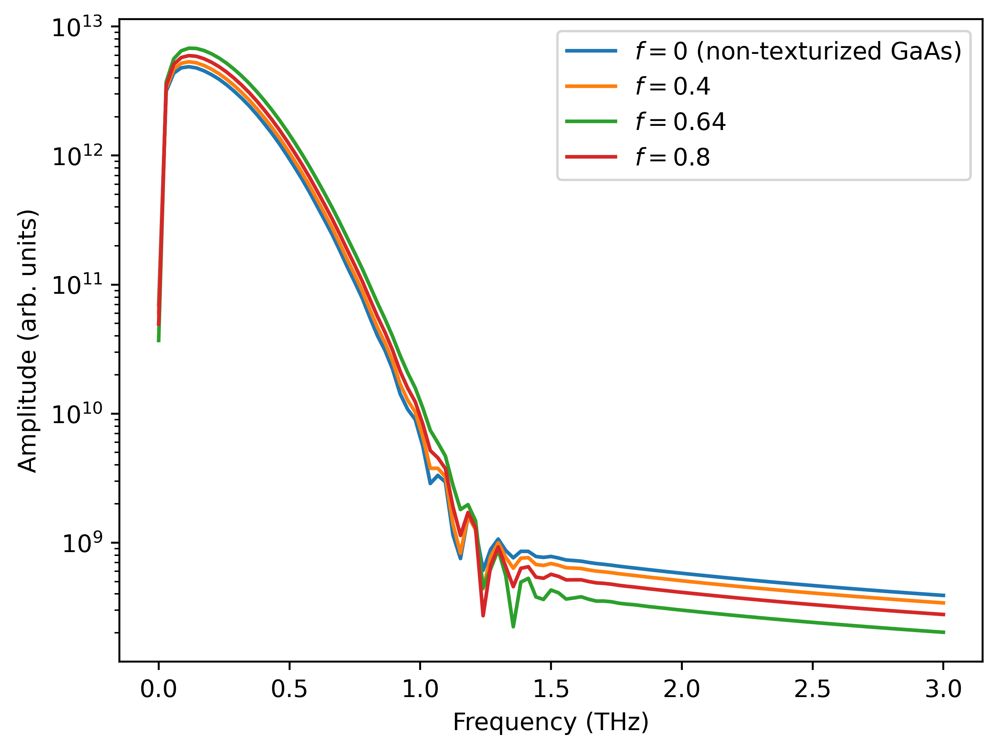

In [40]:
sample_rate = 105
N = (2 - 0) * sample_rate
frequency = np.linspace (0.0, 3, int (N/2))

freqgaas = fft(gradjt)
freqgaas1 = fft(gradjt1)
freqgaas2 = fft(gradjt2)
freqgaas3 = fft(gradjt3)
ygaas = 2/N * np.abs (freqgaas [0: int (N/2)])
ygaas1 = 2/N * np.abs (freqgaas1 [0: int (N/2)])
ygaas2 = 2/N * np.abs (freqgaas2 [0: int (N/2)])
ygaas3 = 2/N * np.abs (freqgaas3 [0: int (N/2)])
plt.figure(dpi=500)
plt.yscale('log')
plt.xlabel("Frequency (THz)")
plt.ylabel(r"Amplitude (arb. units)")

plt.plot(frequency,ygaas,label=r'$f=0$ (non-texturized GaAs)')
plt.plot(frequency,ygaas1,label=r'$f=0.4$')
plt.plot(frequency,ygaas2,label=r'$f=0.64$')
plt.plot(frequency,ygaas3,label=r'$f=0.8$')
plt.legend()

43284558154707.19
62887781482203.31


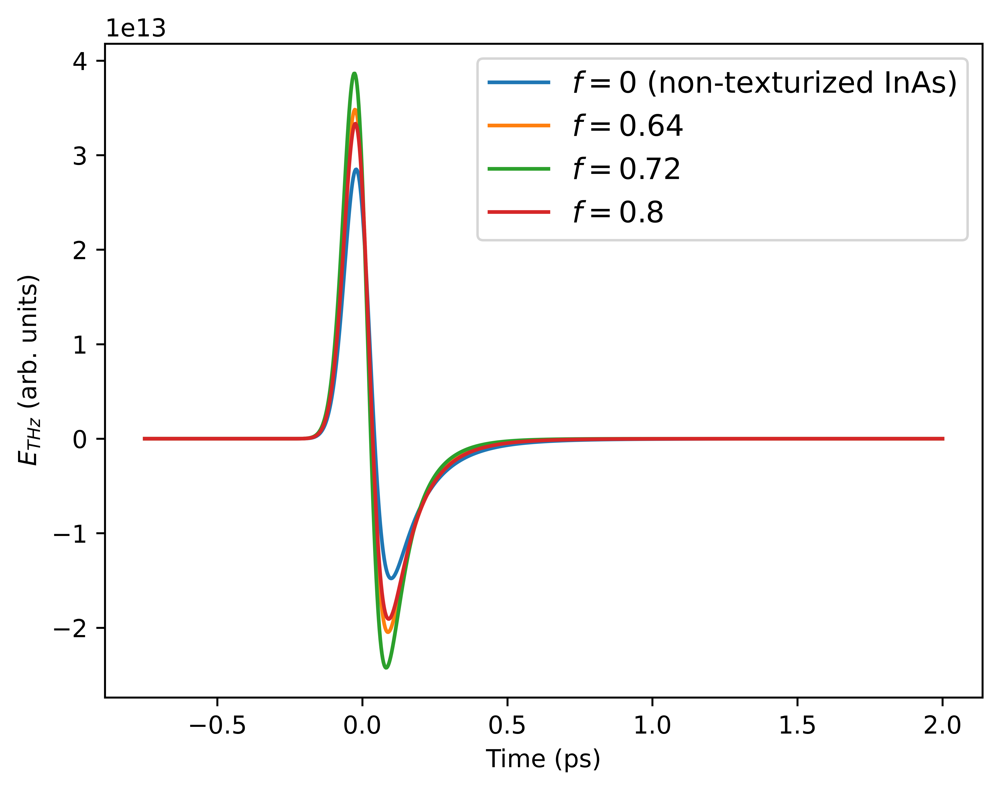

In [41]:


jttin=inasJ(Rinas[628,0], tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas)
jttin1=inasJ(Rinas[628,640], tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas)
jttin2=inasJ(Rinas[628,720], tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas)
jttin3=inasJ(Rinas[628,800], tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas)

gradinjt=np.gradient(jttin)
gradinjt1=np.gradient(jttin1)
gradinjt2=np.gradient(jttin2)
gradinjt3=np.gradient(jttin3)

plt.figure(dpi=1000)
plt.plot(tplot,gradinjt, label=r'$f=0$ (non-texturized InAs)')
#plt.plot(tplot,gradjt, label=r'GaAs')
plt.plot(tplot,gradinjt1, label=r'$f=0.64$')
plt.plot(tplot,gradinjt2, label=r'$f=0.72$')
plt.plot(tplot,gradinjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':12})
print(max(gradinjt)-min(gradinjt))
print(max(gradinjt2)-min(gradinjt2))

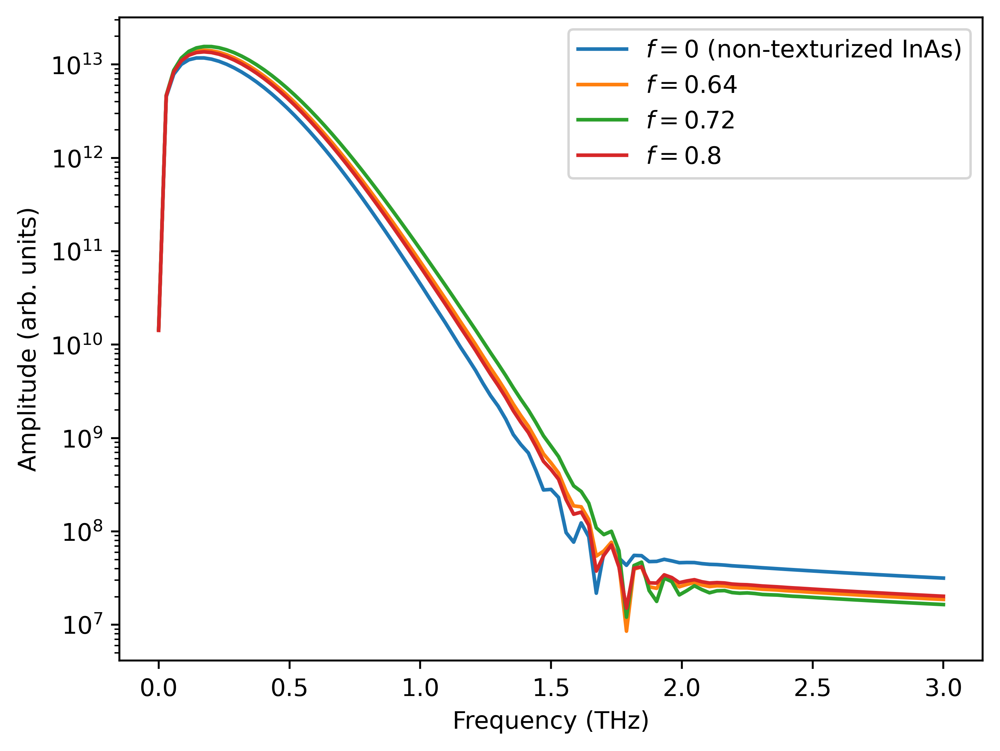

In [42]:
sample_rate = 105
N = (2 - 0) * sample_rate
frequency = np.linspace (0.0, 3,int (N/2))

freqinas = fft(gradinjt)
freqinas1 = fft(gradinjt1)
freqinas2 = fft(gradinjt2)
freqinas3 = fft(gradinjt3)
yinas = 2/N * np.abs (freqinas [0:int (N/2)])
yinas1 = 2/N * np.abs (freqinas1 [0:int (N/2)])
yinas2 = 2/N * np.abs (freqinas2 [0:int (N/2)])
yinas3 = 2/N * np.abs (freqinas3 [0:int (N/2)])
plt.figure(dpi=500)
plt.yscale('log')
plt.xlabel("Frequency (THz)")
plt.ylabel("Amplitude (arb. units)")

plt.plot(frequency,yinas,label=r'$f=0$ (non-texturized InAs)')
plt.plot(frequency,yinas1,label=r'$f=0.64$')
plt.plot(frequency,yinas2,label=r'$f=0.72$')
plt.plot(frequency,yinas3,label=r'$f=0.8$')
plt.legend()

In [43]:
print(Rgaas[1,1])
print(Rinas[1,1])

0.32598806741856257
0.3414539594464786


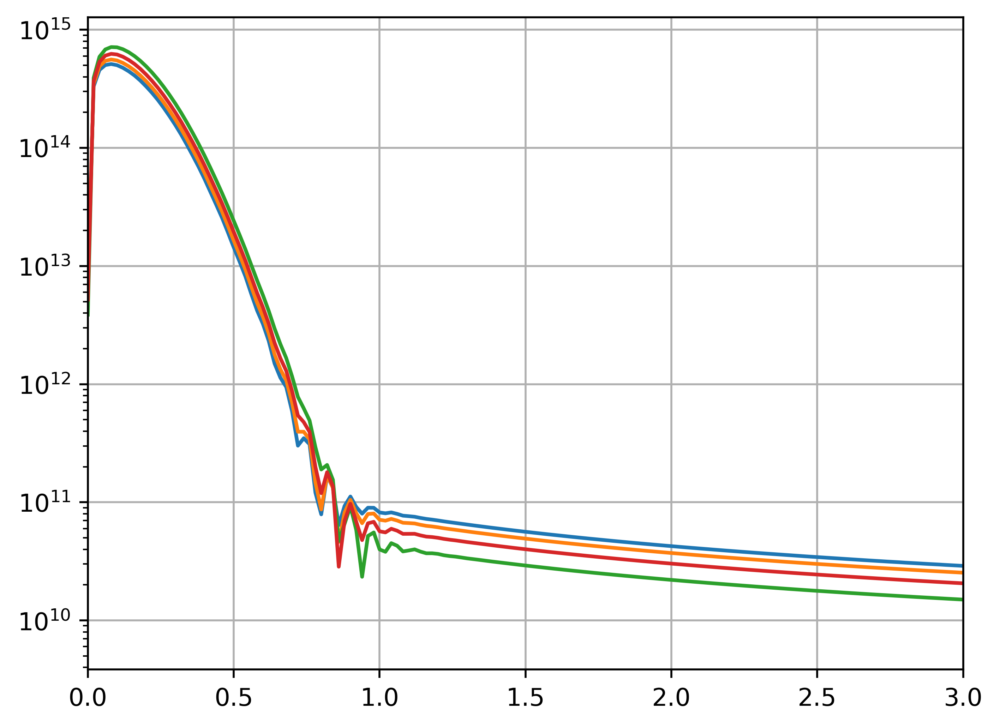

In [44]:
data_step=2.75e-15
tar=np.arange(start=-0.75e-12,stop=2e-12,step=data_step)
# Number of sample points
n    = len(tar)
yf   = rfft(gradjt)
yf1   = rfft(gradjt1)
yf2   = rfft(gradjt2)
yf3   = rfft(gradjt3)
xf   = rfftfreq(n,data_step)
plt.figure(dpi=500)
#plt.xscale('log')
plt.yscale('log')
xfplot=np.linspace(0,10,len(xf))
plt.plot(xfplot,np.abs(yf))
plt.plot(xfplot,np.abs(yf1))
plt.plot(xfplot,np.abs(yf2))
plt.plot(xfplot,np.abs(yf3))
plt.grid()
plt.xlim(0,3)

plt.show()

# yfi   = rfft(gradinjt)
yfi1   = rfft(gradinjt1)
yfi2   = rfft(gradinjt2)
yfi3   = rfft(gradinjt3)
xfi   = rfftfreq(n,data_step)
plt.figure(dpi=500)
#plt.xscale('log')
plt.yscale('log')
xfplot=np.linspace(0,10,len(xf))
plt.plot(xfplot,np.abs(yfi))
plt.plot(xfplot,np.abs(yfi1))
plt.plot(xfplot,np.abs(yfi2))
plt.plot(xfplot,np.abs(yfi3))
plt.grid()
plt.xlim(0,3)

plt.show()

In [45]:
THzptpgaas=[]
for i in range(1000):
    for j in range(1000):
        y0=np.zeros([2])
        y0[0]= 0
        y0[1]= E_bias
        scriptRgaas=Rgaas[i,j]
        solgaas2=odeint(param,y0,t, args=(scriptRgaas, tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas))
        ntgaas2=solgaas2[:,0]
        vggaas2=solgaas2[:,1]
        jttgaas=q*ntgaas2*mu_gaas*(vggaas2/L)
        djtgaas=np.gradient(jttgaas)
        ptpgaas=max(djtgaas)-min(djtgaas)
        THzptpgaas.append(ptpgaas)

DTHzptpgaas=np.reshape(THzptpgaas, (1000,1000))

22188912515749.75


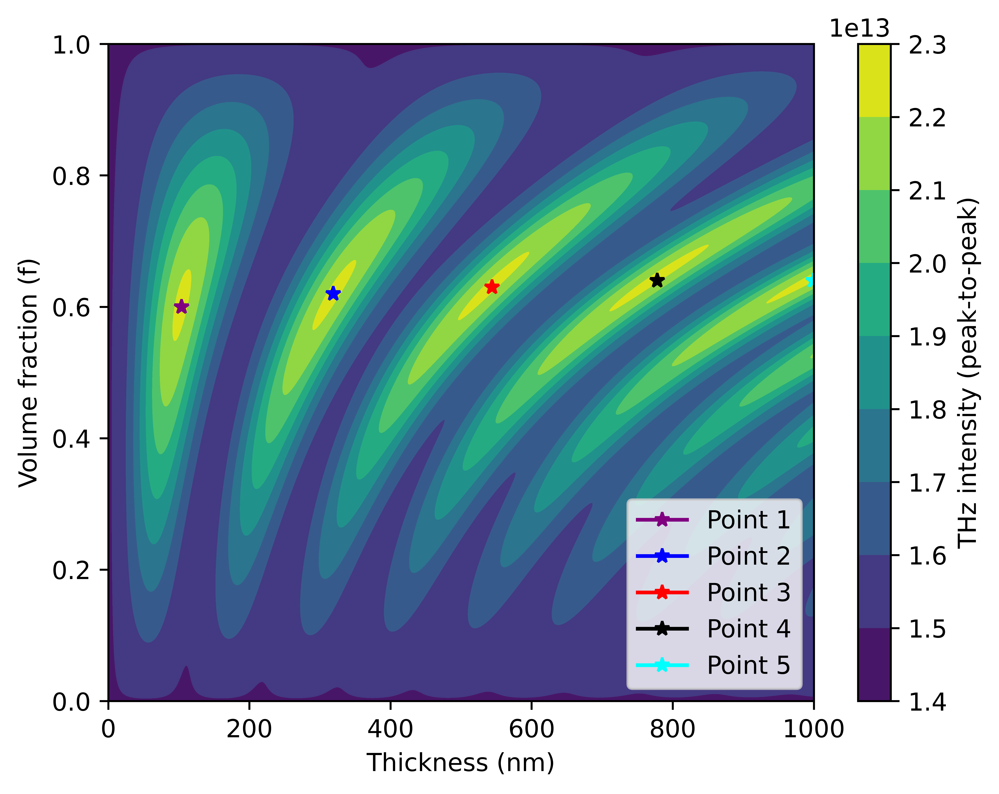

In [46]:
vf=np.linspace(0,1000,1000)
hh=np.linspace(0,1.0,1000)
hplot,vfplot=np.meshgrid(hh,vf)

plt.figure(dpi=1000)
plt.contourf(vfplot,hplot,DTHzptpgaas)
plt.colorbar(label='THz intensity (peak-to-peak)')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')
plt.plot(104,0.6, marker='*',color='purple', label='Point 1')
plt.plot(319,0.62, marker='*',color='blue', label='Point 2')
plt.plot(544,0.63, marker='*',color='red', label='Point 3')
plt.plot(778,0.64, marker='*',color='black', label='Point 4')
plt.plot(999,0.64, marker='*',color='cyan', label='Point 5')
plt.legend(loc = "lower right")
print(np.amax(DTHzptpgaas))

In [47]:
THzptpinas=[]
for i in range(1000):
    for j in range(1000):
        y0=np.zeros([2])
        y0[0]= 0
        y0[1]= E_bias
        scriptRinas=Rinas[i,j]
        solinas2=odeint(param,y0,t, args=(scriptRinas, tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas))
        ntinas2=solinas2[:,0]
        vginas2=solinas2[:,1]
        jttinas=q*ntinas2*mu_inas*(vginas2/L)
        djtinas=np.gradient(jttinas)
        ptpinas=max(djtinas)-min(djtinas)
        THzptpinas.append(ptpinas)

DTHzptpinas=np.reshape(THzptpinas, (1000,1000))

22188912515749.75


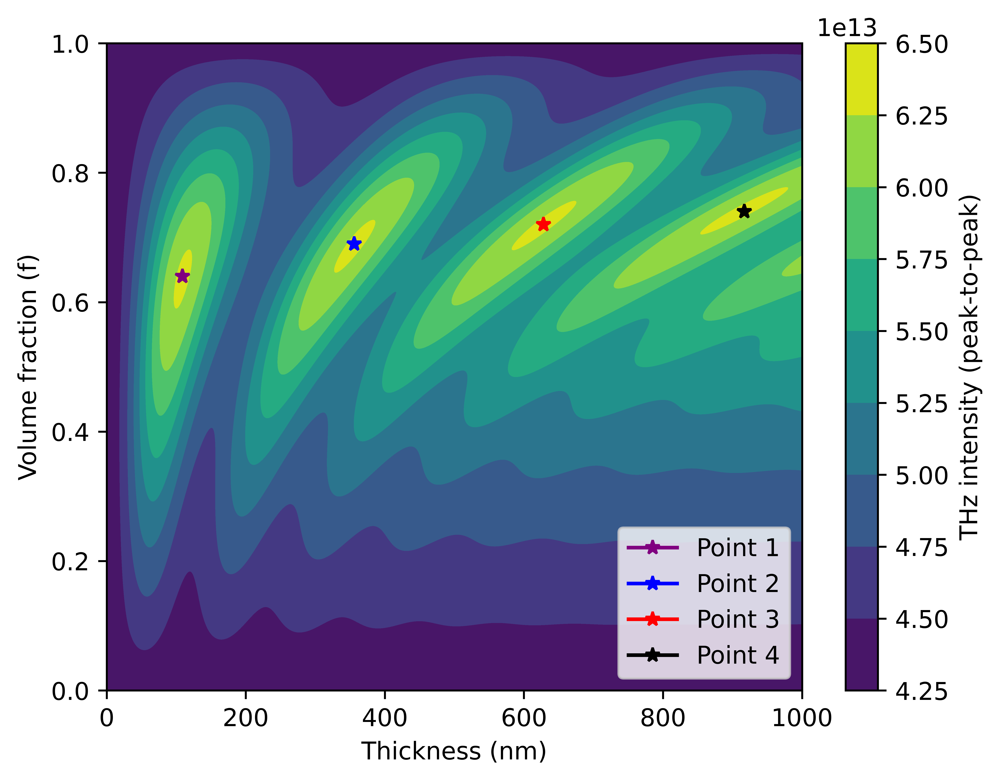

In [48]:
vf=np.linspace(0,1000,1000)
hh=np.linspace(0,1.0,1000)
hplot,vfplot=np.meshgrid(hh,vf)

plt.figure(dpi=1000)
plt.contourf(vfplot,hplot,DTHzptpinas)
plt.colorbar(label='THz intensity (peak-to-peak)')
plt.ylabel('Volume fraction (f)')
plt.xlabel('Thickness (nm)')
plt.plot(109,0.64, marker='*',color='purple', label='Point 1')
plt.plot(356,0.69, marker='*',color='blue', label='Point 2')
plt.plot(628,0.72, marker='*',color='red', label='Point 3')
plt.plot(917,0.74, marker='*',color='black', label='Point 4')

plt.legend(loc = "lower right")
print(np.amax(DTHzptpgaas))

# For the comparison section

In [52]:
inastds = pd.read_csv('data/inastds.csv', header=None)
inasfft = pd.read_csv('data/inasfft.csv', header=None)
gaastds = pd.read_csv('data/gaastds.csv', header=None)
gaasfft = pd.read_csv('data/gaasfft.csv', header=None)

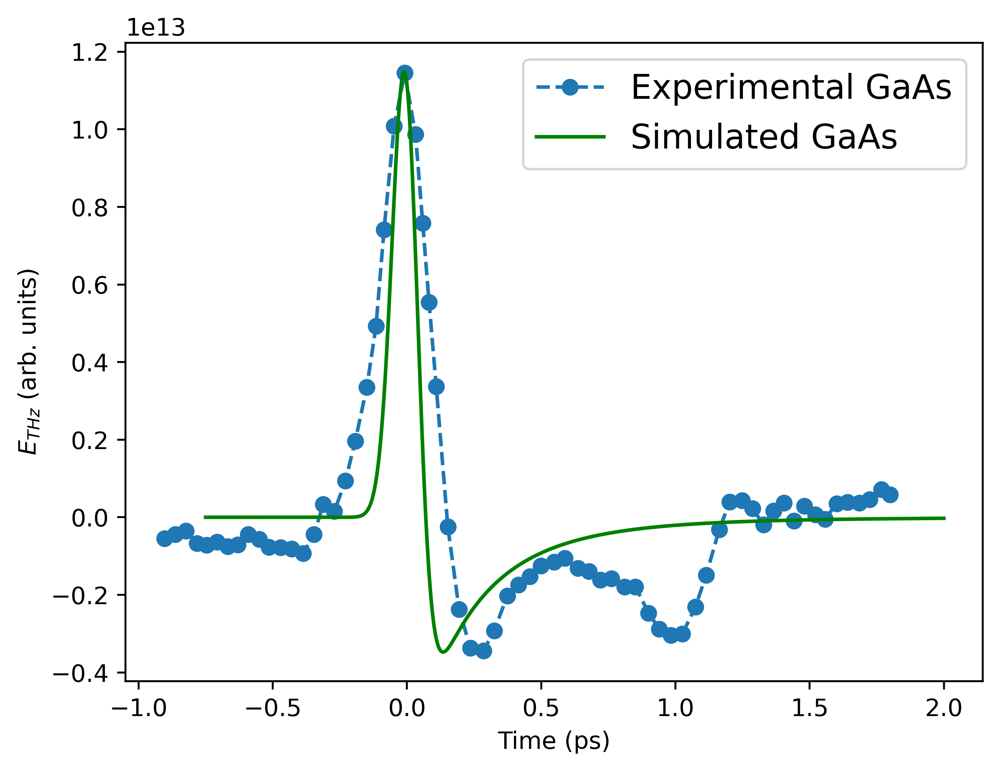

In [62]:
plt.figure(dpi=500)
plt.plot(gaastds[0]-0.18,2.8e13*gaastds[1],'--o', label='Experimental GaAs')
plt.plot(tplot,gradgaas,'g',label=r'Simulated GaAs')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})

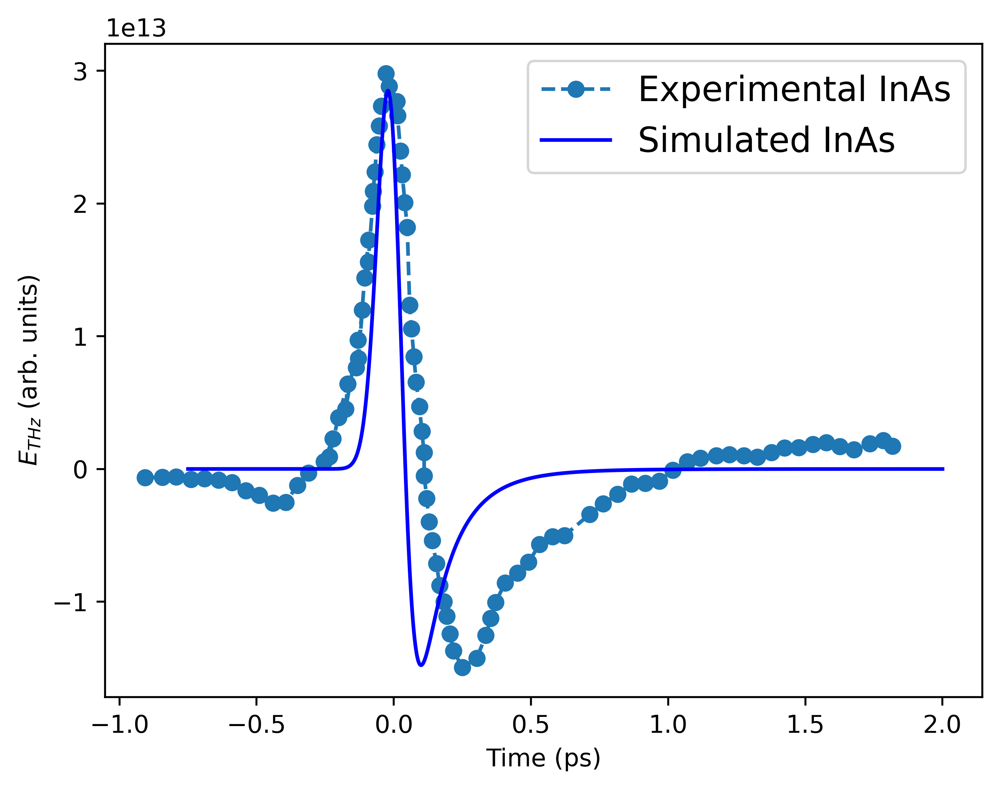

In [55]:
plt.figure(dpi=500)
#plt.plot(gaastds[0],2.8e13*gaastds[1],'--', label='Experimental GaAs')
#plt.plot(tplot,gradgaas,'g',label=r'Simulated GaAs')
plt.plot(inastds[0]-0.18,15e12*inastds[1],'--o', label='Experimental InAs')
plt.plot(tplot,gradinas,'b',label=r'Simulated InAs')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})

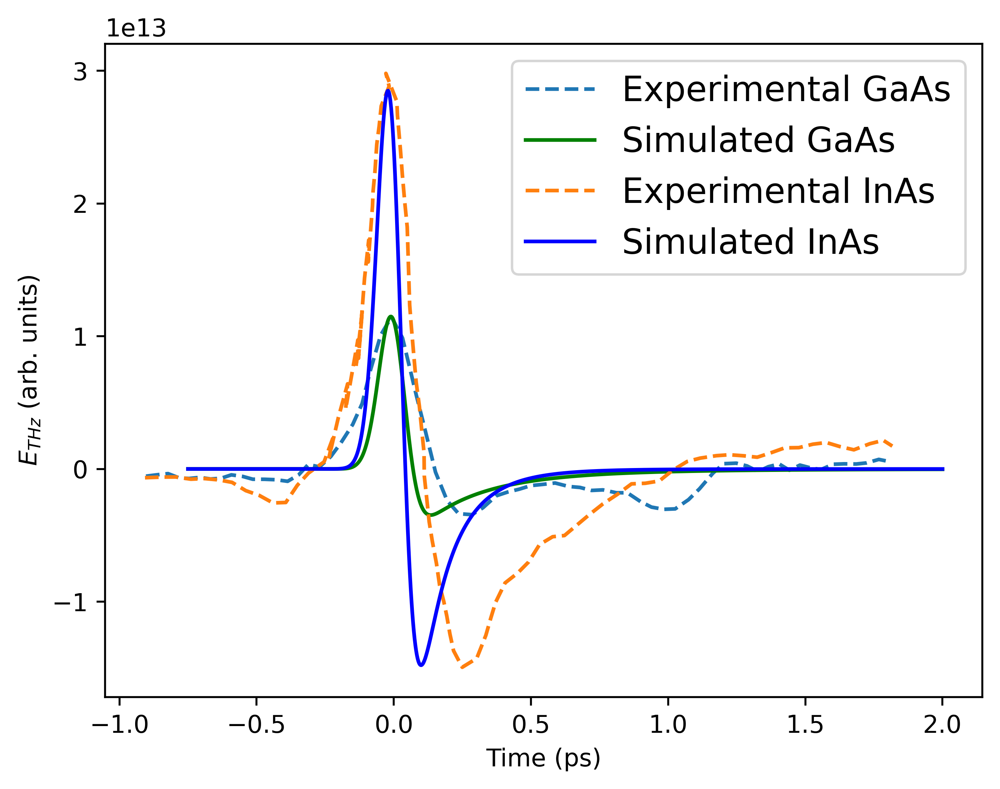

In [56]:

plt.figure(dpi=500)
plt.plot(gaastds[0]-0.18,2.8e13*gaastds[1],'--', label='Experimental GaAs')
plt.plot(tplot,gradgaas,'g',label=r'Simulated GaAs')
plt.plot(inastds[0]-0.18,15e12*inastds[1],'--', label='Experimental InAs')
plt.plot(tplot,gradinas,'b',label=r'Simulated InAs')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})

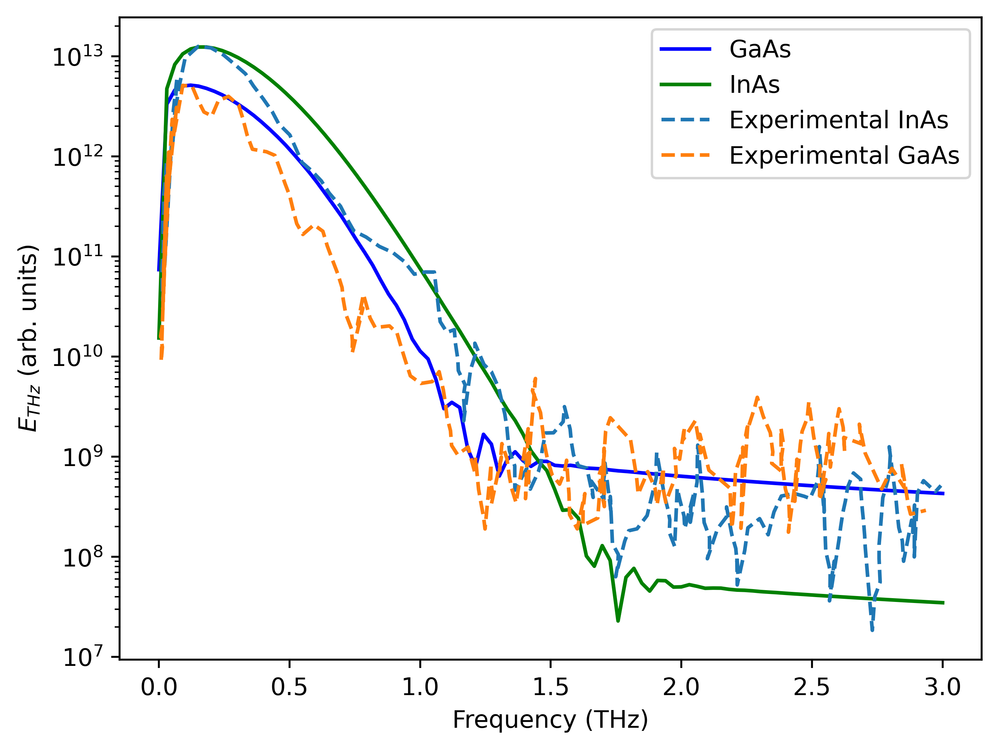

In [57]:
sample_rate = 100
N = (2 - 0) * sample_rate
frequency = np.linspace (0.0, 3, int (N/2))

freq_datagaas = fft(gradgaas)
freq_datainas = fft(gradinas)
yg = 2/N * np.abs (freq_datagaas [0: int (N/2)])
yi = 2/N * np.abs (freq_datainas [0: int (N/2)])
plt.figure(dpi=500)
plt.yscale('log')
plt.xlabel("Frequency (THz)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
plt.plot(frequency,yg,'b',label='GaAs')
plt.plot(frequency,yi,'g',label='InAs')
plt.plot(inasfft[0],3.3e14*inasfft[1],'--', label='Experimental InAs')
plt.plot(gaasfft[0],3.3e15*gaasfft[1],'--', label='Experimental GaAs')
plt.legend()

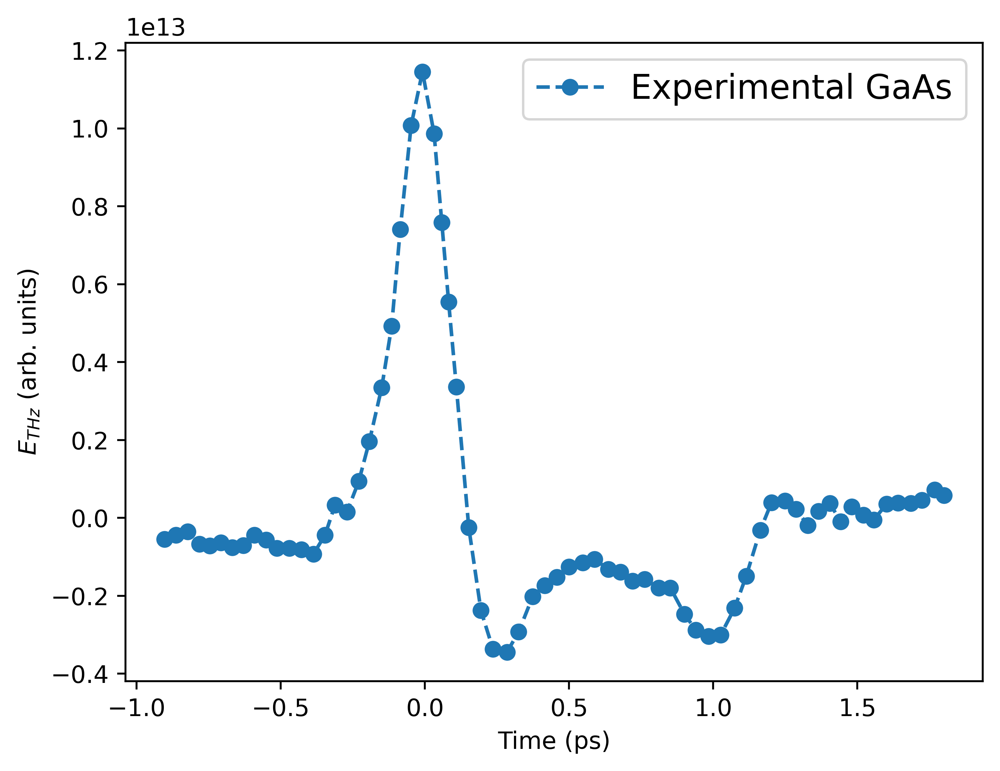

In [58]:
plt.figure(dpi=500)
plt.plot(gaastds[0]-0.18,2.8e13*gaastds[1],'--o', label='Experimental GaAs')
#plt.plot(tplot,gradgaas,'g',label=r'Simulated GaAs')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})

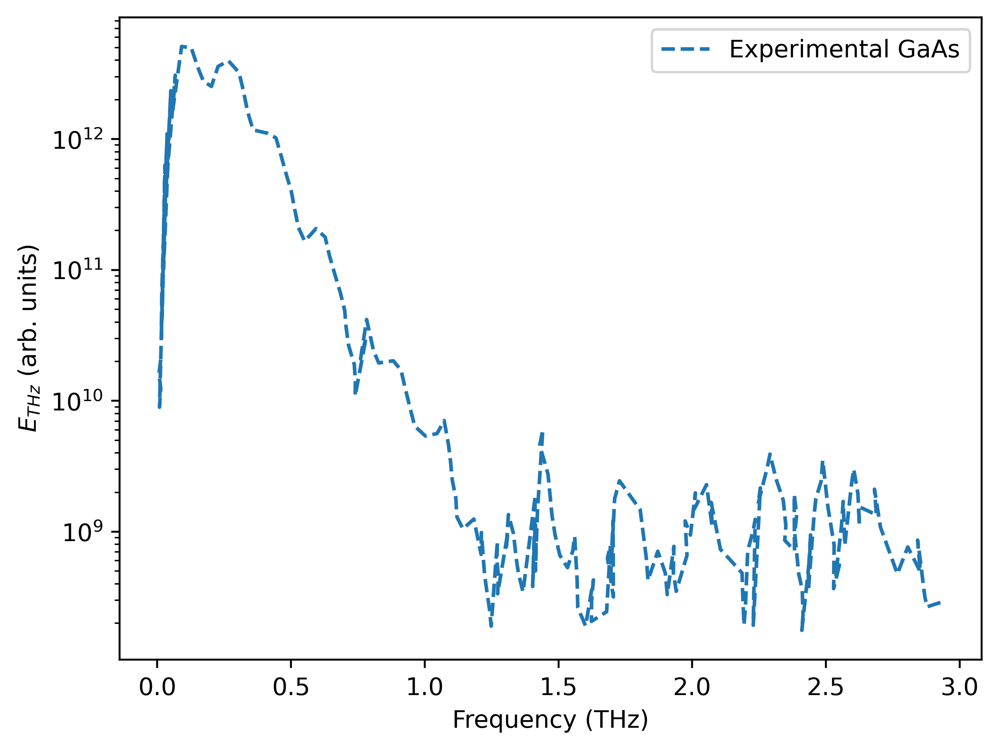

In [59]:
sample_rate = 100
N = (2 - 0) * sample_rate
frequency = np.linspace (0.0, 3, int (N/2))

freq_datagaas = fft(gradgaas)
freq_datainas = fft(gradinas)
yg = 2/N * np.abs (freq_datagaas [0: int (N/2)])
yi = 2/N * np.abs (freq_datainas [0: int (N/2)])
plt.figure(dpi=500)
plt.yscale('log')
plt.xlabel("Frequency (THz)")
plt.ylabel(r"$E_{THz}$ (arb. units)")
#plt.plot(frequency,yg,'b',label='GaAs')
#plt.plot(frequency,yi,'g',label='InAs')
#plt.plot(inasfft[0],3.3e14*inasfft[1],'--', label='Experimental InAs')
plt.plot(gaasfft[0],3.3e15*gaasfft[1],'--', label='Experimental GaAs')
plt.legend()

In [60]:
s1olinas=odeint(param,y0,t, args=(Rinas[0,0], tau_l, tau_c, tau_r, mu_inas, alpha_inas, epsilon_inas))
v1ginas=s1olinas[:,1]
s1olgaas=odeint(param,y0,t, args=(Rgaas[0,0], tau_l, tau_c, tau_r, mu_gaas, alpha_gaas, epsilon_gaas))
v1ggaas=s1olgaas[:,1]

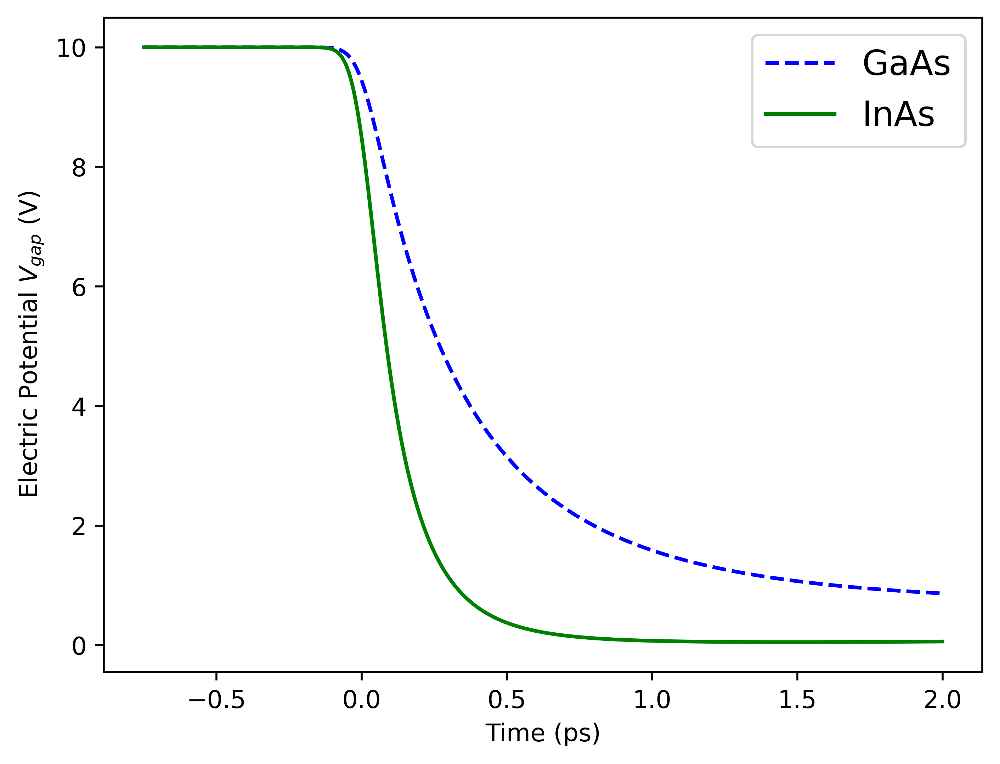

In [61]:
plt.figure(dpi=500)
#plt.plot(tplot,gradjt, label=r'$f=0$ (non-texturized)')
plt.plot(tplot,v1ggaas,'--b', label='GaAs')
plt.plot(tplot,v1ginas,'g',label=r'InAs')
#plt.plot(tplot,gradjt2, label=r'$f=0.64$')
#plt.plot(tplot,gradjt3, label=r'$f=0.8$')
plt.xlabel("Time (ps)")
plt.ylabel(r"Electric Potential $V_{gap}$ (V)")
#plt.title("Induced THz")
plt.legend(loc = "best",prop={'size':14})